In [1]:
library(readxl)
library(tidyverse)
library(stringr)
library(ggplot2)
library(gridExtra)
library(grid)
library(rjags)
library(coda)
library(tidyr)
library(dplyr)
library(RColorBrewer)
options(warn = -1)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Loading required package: coda

Linked to JAGS 4.3.2

Loaded modules: basemod,bugs



# IMPORT VECCHIO - NON USARE

In [2]:
#
## cambia directory
#
#setwd("/home/samu/AdvStats/Project/Data")
#files <- list.files(pattern = ".xlsx?$", full.names = TRUE)
#
#process_file <- function(file_path) {
#  file_name <- tools::file_path_sans_ext(basename(file_path))
#  parts <- str_split(file_name, "_")[[1]]
#  tipo <- parts[length(parts)]
#  paese <- paste(parts[-length(parts)], collapse = "_")
#
#  df <- read_excel(file_path, skip = 6)
#  df <- df %>% filter(!is.na(Anno))
#  metadata <- read_excel(file_path, n_max = 6 - 2, col_names = FALSE)
#
#  df$paese <- paese
#  df$tipo <- tipo
#
#  return(df)
#}
#
#df_list <- lapply(files, process_file)
#df_finale <- bind_rows(df_list)
#
##cat("nrow:", nrow(df_finale), "\n")
#cat("Pesi:", unique(df_finale$paese), "\n")
#cat("Tipi:", unique(df_finale$tipo), "\n")
#cat("Anni:", unique(df_finale$Anno), "\n") ### !!! 'Medio mensile' è considerato un anno, toglibile se da problemi
#df_finale
#
#df_finale_months <- df_finale |> select('GEN':'DIC')
#df_finale$std <- apply(df_finale_months,1,sd)/(12)^0.5 # sd over rows
#df_finale
#
##### Divide the dataframes for min, max and mean monthly averages
#
### version without 'Medio mensile'
#df_anni <- df_finale %>% 
#  filter(Anno != "Medio mensile") %>%
#  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))
#
#df_min <- df_anni %>% 
#  filter(tipo == "min")
#df_max <- df_anni %>% 
#  filter(tipo == "max")
#df_mean <- df_anni %>% 
#  filter(tipo == "mean")


# New Import

In [3]:
setwd("Data")


In [4]:
# to chenge directory
files <- list.files(pattern = "\\csv?$", full.names = TRUE)

process_file <- function(file_path) {
  file_name <- tools::file_path_sans_ext(basename(file_path))
  parts <- str_split(file_name, "_")[[1]]
  paese <- paste(parts[-length(parts)], collapse = "_")

  df <- read_csv(file_path, show_col_types = FALSE)
  df <- df %>% filter(!is.na(TMIN)) ##ho tolto i vari buchi soprattutto i 6 anni di castelfranco

  df$paese <- paese

  return(df)
}

df_list <- lapply(files, process_file)
df_import <- bind_rows(df_list)

#cat("nrow:", nrow(df_finale), "\n")
#cat("Paesi:", unique(df_finale$paese), "\n")
#cat("Anni:", unique(df_finale$date), "\n") ### !!! 'Medio mensile' è considerato un anno, toglibile se da problemi
df_94<-df_import%>%
      filter(year(date)>1993 & year(date)<2025)#%>%
      #rename(min = TMIN, mean = TMED, max = TMAX)

head(df_94)
tail(df_94)

date,TMIN,TMED,TMAX,paese
<date>,<dbl>,<dbl>,<dbl>,<chr>
1994-01-01,-6.1000,-2.1979,0.4000,Auronzo
1994-01-02,-12.7000,-7.5431,-2.3000,Auronzo
1994-01-03,-9.4407,-4.9648,2.1650,Auronzo
1994-01-04,-6.7956,-3.4558,-0.9134,Auronzo
1994-01-05,-2.9000,-0.0854,4.4000,Auronzo
1994-01-06,0.0000,0.9302,1.6000,Auronzo


date,TMIN,TMED,TMAX,paese
<date>,<dbl>,<dbl>,<dbl>,<chr>
2024-12-26,-3.8,1.2,9.3,Roverchiara
2024-12-27,-2.5,1.9,9.2,Roverchiara
2024-12-28,-2.0,3.2,11.8,Roverchiara
2024-12-29,-2.2,2.4,11.4,Roverchiara
2024-12-30,-2.3,2.1,11.4,Roverchiara
2024-12-31,-2.8,1.5,9.8,Roverchiara


## 0) Study the evolution over time of the min, max and average temperatures computed over one month.


In [5]:
df_month<- df_94 %>%
  mutate(Anno = year(date),
         Mese = month(date)) %>%
  group_by(paese, Anno, Mese) %>%
  summarise(
    min = mean(TMIN, na.rm = TRUE),
    mean = mean(TMED, na.rm = TRUE),
    max = mean(TMAX, na.rm = TRUE),
    .groups = "drop"
  )

df_long <- df_month%>%
  pivot_longer(cols = c(min, mean, max),
               names_to = "tipo",
               values_to = "valore")

mese_abb <- c("GEN", "FEB", "MAR", "APR", "MAG", "GIU", "LUG", "AGO", "SET", "OTT", "NOV", "DIC")
df_long <- df_long %>%
  mutate(mese_abb = mese_abb[Mese]) 

### to have months as columns
df_wide <- df_long %>%
  select(paese, Anno, tipo, mese_abb, valore) %>%
  pivot_wider(names_from = mese_abb, values_from = valore)

df_finale <- df_wide %>%
  rowwise() %>%
  mutate(Medio = mean(c_across(all_of(mese_abb)), na.rm = TRUE)) %>% # 2025 removed because there were problems with the averages 
  ungroup()

head(df_finale)

paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064


In [6]:
df_finale_months <- df_finale |> select('GEN':'DIC')
df_finale$std <- apply(df_finale_months,1,sd)/(12)^0.5 # sd over rows
head(df_finale)


paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,std
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995,1.766283
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837,2.112294
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319,2.382074
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853,1.915043
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163,2.141889
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064,2.376033


In [7]:
## version without 'Medio mensile'

df_anni <- df_finale %>% 
  filter(Anno != "Medio mensile") %>%
  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))

df_min <- df_anni %>% 
  filter(tipo == "min")
df_max <- df_anni %>% 
  filter(tipo == "max")
df_mean <- df_anni %>% 
  filter(tipo == "mean")

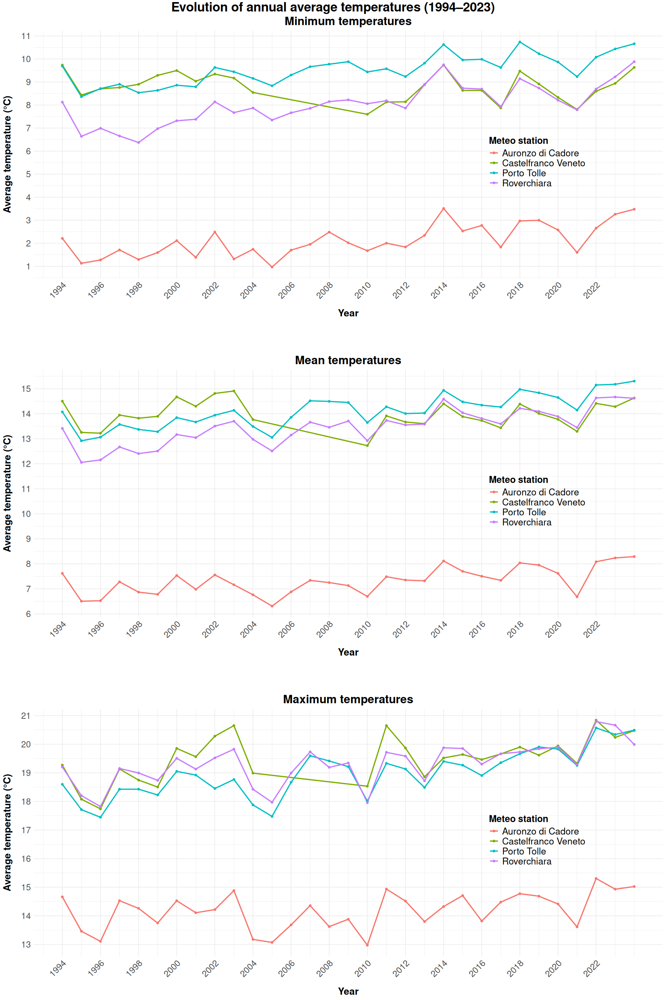

In [8]:

names_stat <- c("Roverchiara" = "Roverchiara", "Castelfranco" = "Castelfranco Veneto",
  "PortoTolle" = "Porto Tolle","Auronzo" = "Auronzo di Cadore")

plot_0 <- function(df, title, names) {
  ggplot(df, aes(x = Anno, y = Medio, color = paese)) +
    geom_line(size = 1) +
    geom_point() +
    scale_color_discrete(labels = names) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station"
    ) +
    theme_minimal() +
    scale_x_continuous(breaks = seq(1994, 2022, 2)) +
    scale_y_continuous(breaks = seq(0, 21, 1)) +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 15),
      axis.text.y = element_text(size = 15),
      axis.title.x = element_text(size = 17, margin = margin(t = 15),face="bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15),face="bold"),
      legend.position = c(0.8, 0.47),
      legend.title = element_text(size = 16,face="bold"),
      legend.text = element_text(size = 16)
    )
}


options(repr.plot.width = 16, repr.plot.height = 24)


min_plot <- plot_0(df_min, 'Minimum temperatures', names_stat)
mean_plot <- plot_0(df_mean, 'Mean temperatures', names_stat)
max_plot <- plot_0(df_max, 'Maximum temperatures', names_stat)

grid.arrange(
  min_plot, nullGrob(), mean_plot, nullGrob(), max_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023)', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"))
)

## 1) Analysis of the evolution of the annual average of the min, max and daily averate temperature over time (1993-2024).

## 1.1)
Study the trend of the annual averages and compare them with a constant value or a rising trend
(for instance linear or quadratic).


In [9]:
#linear fit 

lin_fits <- list()
  
  for (i in names(names_stat)) {  
  df_min_i  <- df_min[df_min$paese == i,]
  df_mean_i <- df_mean[df_mean$paese == i,]
  df_max_i  <- df_max[df_max$paese == i,]
  
  if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
    cat("No data found for station:", i, "\n")
    next}

  lin_fit_min  <- lm(Medio ~ Anno, data = df_min_i,weights = 1/std^2)
  lin_fit_mean <- lm(Medio ~ Anno, data = df_mean_i,weights = 1/std^2)
  lin_fit_max  <- lm(Medio ~ Anno, data = df_max_i,weights = 1/std^2)

  lin_fits[[i]] <- list(
    min = lin_fit_min,
    mean = lin_fit_mean,
    max = lin_fit_max) }

lin_fits
    

$Roverchiara
$Roverchiara$min

Call:
lm(formula = Medio ~ Anno, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
 -141.93631      0.07468  


$Roverchiara$mean

Call:
lm(formula = Medio ~ Anno, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
 -117.78664      0.06534  


$Roverchiara$max

Call:
lm(formula = Medio ~ Anno, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  -82.95907      0.05091  



$Castelfranco
$Castelfranco$min

Call:
lm(formula = Medio ~ Anno, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
   31.03931     -0.01106  


$Castelfranco$mean

Call:
lm(formula = Medio ~ Anno, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  10.306411     0.001824  


$Castelfranco$max

Call:
lm(formula = Medio ~ Anno, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  -69.27094      0.04418  



$PortoTolle
$Por

In [10]:
lin_summary <- data.frame(
  paese = character(),
  temp = character(),
  intercept = numeric(),
  slope = numeric(),
  intercept_se = numeric(),
  slope_se = numeric(),
  r_squared = numeric(),
  p_value = numeric(),
  residual_se = numeric(),
  stringsAsFactors = FALSE)

for (i in names(lin_fits)) {
  for (stat in c("min", "mean", "max")) {
    fit <- lin_fits[[i]][[stat]]
    summary_fit <- summary(fit)

    lin_summary <- rbind(lin_summary, data.frame(
      paese = i,
      temp = stat,
      intercept = coef(fit)[1],
      slope = coef(fit)[2],
      intercept_se = coef(summary_fit)[, "Std. Error"][1],
      slope_se = coef(summary_fit)[, "Std. Error"][2],
      r_squared = summary_fit$r.squared,
      p_value = coef(summary_fit)[, "Pr(>|t|)"][2], # p-value tests the null hypothesis: fit slope=0
      residual_se = summary_fit$sigma),
      make.row.names = FALSE) }
}
lin_summary

paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,min,-141.93631,0.074675865,23.86580,0.011880217,0.576706823,7.295410e-07,0.3099477
Roverchiara,mean,-117.78664,0.065340335,17.44501,0.008683951,0.661272467,2.708450e-08,0.1918881
Roverchiara,max,-82.95907,0.050907708,22.40848,0.011153702,0.418043536,8.501852e-05,0.2153602
Castelfranco,min,31.03931,-0.011055101,24.93245,0.012409228,0.032010705,3.818393e-01,0.3040848
Castelfranco,mean,10.30641,0.001823974,22.27826,0.011087455,0.001126348,8.707090e-01,0.2428447
Castelfranco,max,-69.27094,0.044175337,26.56039,0.013215602,0.317666419,2.713628e-03,0.2648194
PortoTolle,min,-102.19146,0.055628842,17.40438,0.008664236,0.587029821,5.059492e-07,0.2195147
PortoTolle,mean,-103.29838,0.058457110,15.65242,0.007791516,0.659983310,2.864357e-08,0.1772794
PortoTolle,max,-122.77320,0.070558203,20.83553,0.010371243,0.614793380,1.806317e-07,0.2184067


The p-value tests the null hypothesis that the slope coefficient $b$ is compatibile with zero, meaning that there is no statistically significant correlation between the two variables. It is computed defyning the t-student variable:

$$t= \frac{\hat{b}}{\sigma_{\hat{b}}} $$ 

where $\hat{b}$ is the  estimator for the slope and $\sigma_{\hat{b}}$ is its standard deviation, and performing a two-sided hypothesis testing. In almost all cases we can reject the null hypothesis with a very high $CL > 99\%$, and thus claim there is a non zero (in this case positive) correlation between mean temperatures and time, with the exception for:
- Min and mean temperatures in Castelfranco Veneto: p-values = 0.38,0.87
- Max temperatures in Auronzo di Cadore: p-value = 0.03

In [11]:

years <- sort(unique(as.numeric(as.character(df_min$Anno))))

pred_df <- data.frame()
years <- unique(df_min$Anno)

for (i in 1:nrow(lin_summary)) {
  row <- lin_summary[i,]
  model <- lin_fits[[row$paese]][[row$temp]]

  df_stat <- switch(row$temp,
                    "min" = df_min,
                    "mean" = df_mean,
                    "max" = df_max)
  
  df_station <- df_stat[df_stat$paese == row$paese, ]
  
  # linear fit prediction 
  newdata <- data.frame(Anno = years)
  pred <- predict(model, newdata = newdata, se.fit = TRUE)
  
  # compute chi_squared 
  y_obs <- df_station$Medio
  y_pred_obs <- predict(model, newdata = df_station)
  y_err <- df_station$std
  
  chi_squared <- sum(((y_obs-y_pred_obs)^2)/(y_err^2), na.rm = TRUE)


  temp_df <- data.frame(
    paese = row$paese,
    temp = row$temp,
    Anno = years,
    prediction = pred$fit,
    prediction_se = pred$se.fit,
    chi_squared = chi_squared  # same value repeated for all rows
  )
  
  pred_df <- rbind(pred_df, temp_df)
}
pred_df

,paese,temp,Anno,prediction,prediction_se,chi_squared
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,1994,6.967371,0.2057352,2.785959
2,Roverchiara,min,1995,7.042047,0.1956436,2.785959
3,Roverchiara,min,1996,7.116722,0.1857636,2.785959
4,Roverchiara,min,1997,7.191398,0.1761309,2.785959
5,Roverchiara,min,1998,7.266074,0.1667883,2.785959
6,Roverchiara,min,1999,7.340750,0.1577874,2.785959
7,Roverchiara,min,2000,7.415426,0.1491901,2.785959
8,Roverchiara,min,2001,7.490102,0.1410701,2.785959
9,Roverchiara,min,2002,7.564778,0.1335146,2.785959


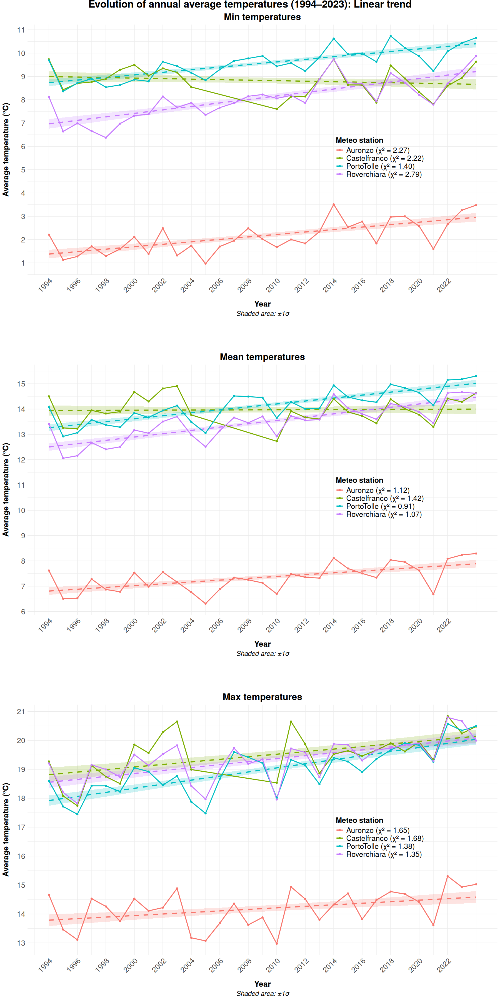

In [12]:
plot_1 <- function(df,pred_df,temp_type,title,names) {
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
    
  df$Medio <- as.numeric(as.character(df$Medio))
    
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  pred_df$prediction_se <- as.numeric(as.character(pred_df$prediction_se))
  chi_values <- pred_df |> group_by(paese) |> summarise(chi_squared=mean(chi_squared),.groups = "drop") 
  legend_labels <- setNames(
      sprintf("%s (χ² = %.2f)", chi_values$paese, chi_values$chi_squared),
      chi_values$paese)
    
  ggplot() +
    geom_ribbon(data = pred_df, aes(x=Anno, ymin=prediction-prediction_se, 
                                   ymax = prediction+prediction_se, fill = paese), alpha = 0.2, show.legend = FALSE) +
    geom_line(data = pred_df, aes(x=Anno, y=prediction, color = paese), size = 1.2, linetype = "dashed") +
    geom_line(data = df, aes(x=Anno, y=Medio, color=paese), size = 1) +
    geom_point(data = df, aes(x=Anno, y=Medio, color=paese)) +

    scale_color_discrete(labels = legend_labels) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station",
      fill=NULL,
      caption = "Shaded area: ±1σ"
    ) +
    scale_x_continuous(breaks = seq(1994, 2022, 2))+
    scale_y_continuous(breaks = seq(0, 21, 1))+
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.75, 0.47),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16),
      plot.caption = element_text(size = 14.5, hjust = 0.5, face = "italic"))
}


options(repr.plot.width = 15, repr.plot.height = 30)
min_lin_fit_plot <-plot_1(df_finale,pred_df,"min",'Min temperatures',names_stat)
mean_lin_fit_plot <-plot_1(df_finale,pred_df,"mean",'Mean temperatures',names_stat)
max_lin_fit_plot <-plot_1(df_finale,pred_df,"max",'Max temperatures',names_stat)

grid.arrange(
  min_lin_fit_plot, nullGrob(), mean_lin_fit_plot, nullGrob(), max_lin_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): Linear trend', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

We perform a $\chi^2$ test evaluate whether the observed data are consistent with a linear model. With 10 degrees of freedom and a $CL=95\%$ the critical value is $\chi^2_0\approx 18.3$, in all cases we obtain significantly lower $\chi^2$ values, thus we can claim that mean temperatures data for all stations are highly consistent with a linear trend model (p-value > 0.986).

In [13]:
p_value_chi <- 1- pchisq(2.79,10)
p_value_chi

[1] 0.9859431

## 1.2)
Perform an analysis using a Bayesian linear regression with JAGS or STAN.

We will use the results of this linear regression as prior for a Bayesian linear regression with JAGS.

In [14]:
head(lin_summary)

,paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,-141.93631,0.074675865,23.86580,0.011880217,0.576706823,7.295410e-07,0.3099477
2,Roverchiara,mean,-117.78664,0.065340335,17.44501,0.008683951,0.661272467,2.708450e-08,0.1918881
3,Roverchiara,max,-82.95907,0.050907708,22.40848,0.011153702,0.418043536,8.501852e-05,0.2153602
4,Castelfranco,min,31.03931,-0.011055101,24.93245,0.012409228,0.032010705,3.818393e-01,0.3040848
5,Castelfranco,mean,10.30641,0.001823974,22.27826,0.011087455,0.001126348,8.707090e-01,0.2428447
6,Castelfranco,max,-69.27094,0.044175337,26.56039,0.013215602,0.317666419,2.713628e-03,0.2648194


In [15]:
prior_min <- lin_summary[which(lin_summary$temp == "min"),]
prior_mean <- lin_summary[which(lin_summary$temp == "mean"),]
prior_max <- lin_summary[which(lin_summary$temp == "max"),]


In [16]:
as.numeric(prior_min[1,3:6])
prior_min

[1] -141.93630515    0.07467587   23.86580246    0.01188022

,paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,-141.93631,0.07467587,23.86580,0.011880217,0.57670682,7.295410e-07,0.3099477
4,Castelfranco,min,31.03931,-0.01105510,24.93245,0.012409228,0.03201071,3.818393e-01,0.3040848
7,PortoTolle,min,-102.19146,0.05562884,17.40438,0.008664236,0.58702982,5.059492e-07,0.2195147
10,Auronzo,min,-103.58489,0.05263996,21.26534,0.010585072,0.46027538,2.734046e-05,0.2799797


In [17]:
# JAGS models

jags_model <- "
model {
  for (i in 1:N) {
    y[i] ~ dnorm(mu[i], tau)
    mu[i] <- a + b * x[i]
  }
  
  # priors (parameters from linear regression above)
  a ~ dnorm(mu_a, tau_a)
  b ~ dnorm(mu_b, tau_b)
  tau <- pow(sigma, -2)  
  sigma ~ dunif(0, 100)}"

jags_model_constant <- "model {
  for (i in 1:N) {
    y[i] ~ dnorm(mu[i], tau)
    mu[i] <- a}
  
  # priors (parameters from linear regression above)
  a ~ dnorm(mu_a, tau_a)
  tau <- pow(sigma, -2)  
  sigma ~ dunif(0, 100) }"

# variables
n.burnin <- 1000
n.chains <- 5
n.iter <- 20000

jags_analysis <- function(model_type,df_min, df_mean, df_max,
                          prior_min, prior_mean, prior_max,
                          names_stat,
                          n.chains = 3,
                          n.burnin = 1000,
                          n.iter = 5000){
   
    if (model_type == "constant") {
    model_string <- jags_model_constant} 
    else if (model_type == "linear") {
    model_string <- jags_model}  # your original model

    samples_jags_min <- data.frame() # to store generataed samples
    samples_jags_mean <- data.frame()
    samples_jags_max <- data.frame()

    pred_jags_min <- data.frame()
    pred_jags_mean <- data.frame()
    pred_jags_max <- data.frame()
    
    for (i in names(names_stat)) {  
        # retrieve data
        df_min_i  <- df_min[df_min$paese == i,]
        df_mean_i <- df_mean[df_mean$paese == i,]
        df_max_i  <- df_max[df_max$paese == i,]
        
        years <- unique(df_min_i$Anno)  
        years <- as.numeric(years) 

         prio_min <- prior_min[prior_min$paese == i, ]
        prio_mean <- prior_mean[prior_mean$paese == i, ]
        prio_max <- prior_max[prior_max$paese == i, ]
  
        # retrieve correct prior
        if (model_type == "constant") {
          prior_list_min <- list(
            mu_a = prio_min$intercept,
            tau_a = 1 / (prio_min$intercept_se^2) )
          prior_list_mean <- list(
            mu_a = prio_mean$intercept,
            tau_a = 1/prio_mean$intercept_se^2)
          prior_list_max <- list(
            mu_a = prio_max$intercept,
            tau_a = 1/prio_max$intercept_se^2)} 
        
        else if (model_type == "linear") {
          prior_list_min <- list(
            mu_a = prio_min$intercept, 
            tau_a = 1/prio_min$intercept_se^2, 
            mu_b = prio_min$slope, 
            tau_b = 1/prio_min$slope_se^2)
          prior_list_mean <- list(
            mu_a = prio_mean$intercept, 
            tau_a = 1/prio_mean$intercept_se^2, 
            mu_b = prio_mean$slope, 
            tau_b = 1/prio_mean$slope_se^2)
          prior_list_max <- list(
            mu_a = prio_max$intercept, 
            tau_a = 1/prio_max$intercept_se^2, 
            mu_b = prio_max$slope, 
            tau_b = 1/prio_max$slope_se^2
          )}
        
        # handle missing data
        if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
            cat("No data found for station:", i, "\n")
            next}
    
        
        # get x (anno) and y (temperatures) and std
        x_min <- as.numeric(df_min_i$Anno)
        x_mean <- as.numeric(df_mean_i$Anno)
        x_max <- as.numeric(df_max_i$Anno)
    
        y_min <- as.numeric(df_min_i$Medio)
        y_mean <- as.numeric(df_mean_i$Medio)
        y_max <- as.numeric(df_max_i$Medio)
    
        y_err_min <- as.numeric(df_min_i$std)
        y_err_mean <- as.numeric(df_mean_i$std)
        y_err_max <- as.numeric(df_max_i$std)
    
        # convert to jags data
        jags_data_min <- list(x = x_min, y = y_min, N = length(y_min))
        jags_data_mean <- list(x = x_mean, y = y_mean, N = length(y_mean))
        jags_data_max <- list(x = x_max, y = y_max, N = length(y_max))
    
        # chain priors
        jags_data_min_full <- c(jags_data_min, prior_list_min)
        jags_data_mean_full <- c(jags_data_mean, prior_list_mean)
        jags_data_max_full <- c(jags_data_max, prior_list_max)
    
        # inits and param
        if (model_type == "constant") {
        inits <- function() list(a = 0, sigma = 1)
        params <- c("a", "sigma")
        } else {
         inits <- function() list(a = 0, b = 0, sigma = 1)
         params <- c("a", "b", "sigma")}
      
        
        ##################################################################
        # run JAGS model (MIN)
        model_jags_min <- jags.model(textConnection(model_string),
                                   data = jags_data_min_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_min, n.burnin, progress.bar="none")  
        samples_min <- coda.samples(model_jags_min, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_min <- as.matrix(samples_min)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_min <- data.frame(
        a = samples_mat_min[, "a"],
        sigma = samples_mat_min[, "sigma"],
        paese = i)} 
        else {
        samples_df_min <- data.frame(
        a = samples_mat_min[, "a"],
        b = samples_mat_min[, "b"],
        sigma = samples_mat_min[, "sigma"],
        paese = i)}
        
        samples_jags_min <- rbind(samples_jags_min, samples_df_min)
    
        ##################################################################
        # run JAGS model (MEAN)
        model_jags_mean <- jags.model(textConnection(model_string),
                                   data = jags_data_mean_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_mean, n.burnin, progress.bar="none")  # burn-in
        samples_mean <- coda.samples(model_jags_mean, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_mean <- as.matrix(samples_mean)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_mean <- data.frame(
        a = samples_mat_mean[, "a"],
        sigma = samples_mat_mean[, "sigma"],
        paese = i)} 
        else {
        samples_df_mean <- data.frame(
        a = samples_mat_mean[, "a"],
        b = samples_mat_mean[, "b"],
        sigma = samples_mat_mean[, "sigma"],
        paese = i)}
        
        samples_jags_mean <- rbind(samples_jags_mean, samples_df_mean)
    
        #########################################
        # run JAGS model (MAX)
        model_jags_max <- jags.model(textConnection(model_string),
                                   data = jags_data_max_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_max, n.burnin, progress.bar="none")  # burn-in
        samples_max <- coda.samples(model_jags_max, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_max <- as.matrix(samples_max)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_max <- data.frame(
        a = samples_mat_max[, "a"],
        sigma = samples_mat_max[, "sigma"],
        paese = i)} 
        else {
        samples_df_max <- data.frame(
        a = samples_mat_max[, "a"],
        b = samples_mat_max[, "b"],
        sigma = samples_mat_max[, "sigma"],
        paese = i)}
        samples_jags_max <- rbind(samples_jags_max, samples_df_max)
       
        ########################################
        # average on predicitons 
       
        a_post_min <- mean(samples_mat_min[, "a"])
        sigma_post_min <- mean(samples_mat_min[, "sigma"])
        pred_se_min <- rep(sigma_post_min, length(years))
        
        if (model_type == "constant") {
         # min
          pred_min <- rep(a_post_min, length(years))
          y_pred_obs_min <- rep(a_post_min, length(x_min))
          b_post_min <- NA
        } else {
          b_post_min <- mean(samples_mat_min[, "b"])
          pred_min <- a_post_min + b_post_min * years
          y_pred_obs_min <- a_post_min + b_post_min * x_min
        }
        chi_squared_min <- sum(((y_min - y_pred_obs_min)^2) / (y_err_min^2), na.rm = TRUE)
        
         # mean
        a_post_mean <- mean(samples_mat_mean[, "a"])
        sigma_post_mean <- mean(samples_mat_mean[, "sigma"])
        pred_se_mean <- rep(sigma_post_mean, length(years))
        
        if (model_type == "constant") {
          pred_mean <- rep(a_post_mean, length(years))
          y_pred_obs_mean <- rep(a_post_mean, length(x_mean))
          b_post_mean <- NA
        } else {
          b_post_mean <- mean(samples_mat_mean[, "b"])
          pred_mean <- a_post_mean + b_post_mean * years
          y_pred_obs_mean <- a_post_mean + b_post_mean * x_mean
        }
        chi_squared_mean <- sum(((y_mean - y_pred_obs_mean)^2) / (y_err_mean^2), na.rm = TRUE)
        
        # max 
        a_post_max <- mean(samples_mat_max[, "a"])
        sigma_post_max <- mean(samples_mat_max[, "sigma"])
        pred_se_max <- rep(sigma_post_max, length(years))
        
        if (model_type == "constant") {
          pred_max <- rep(a_post_max, length(years))
          y_pred_obs_max <- rep(a_post_max, length(x_max))
          b_post_max <- NA
        } else {
          b_post_max <- mean(samples_mat_max[, "b"])
          pred_max <- a_post_max + b_post_max * years
          y_pred_obs_max <- a_post_max + b_post_max * x_max
        }
        chi_squared_max <- sum(((y_max - y_pred_obs_max)^2) / (y_err_max^2), na.rm = TRUE)
            
        
        # make dataframes
       
        temp_df_min <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_min,
            prediction_se = pred_se_min,
            chi_squared = chi_squared_min)
        temp_df_mean <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_mean,
            prediction_se = pred_se_mean,
            chi_squared = chi_squared_mean
        )
        temp_df_max <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_max,
            prediction_se = pred_se_max,
            chi_squared = chi_squared_max
        )
    
        # merge stations
        pred_jags_min <- rbind(pred_jags_min, temp_df_min)
        pred_jags_mean <- rbind(pred_jags_mean, temp_df_mean)
        pred_jags_max <- rbind(pred_jags_max, temp_df_max) }

    return(list(
        pred_jags_min = pred_jags_min,
        pred_jags_mean = pred_jags_mean,
        pred_jags_max = pred_jags_max,
        samples_jags_min = samples_jags_min,
        samples_jags_mean = samples_jags_mean,
        samples_jags_max = samples_jags_max
    )) }


In [18]:
results <- jags_analysis(
    model_type = "linear",
  df_min = df_min,
  df_mean = df_mean,
  df_max = df_max,
  prior_min = prior_min,
  prior_mean = prior_mean,
  prior_max = prior_max,
  names_stat = names_stat,
  n.chains = n.chains,
  n.burnin = n.burnin,
  n.iter = n.iter
)
results

paese,Anno,prediction,prediction_se,chi_squared
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,1994,7.383247,0.6438024,3.450282
Roverchiara,1995,7.427049,0.6438024,3.450282
Roverchiara,1996,7.470852,0.6438024,3.450282
Roverchiara,1997,7.514654,0.6438024,3.450282
Roverchiara,1998,7.558457,0.6438024,3.450282
Roverchiara,1999,7.602259,0.6438024,3.450282
Roverchiara,2000,7.646062,0.6438024,3.450282
Roverchiara,2001,7.689864,0.6438024,3.450282
Roverchiara,2002,7.733667,0.6438024,3.450282


We can take the generated parameters and make probabilistic considerations

In [19]:
all_staz <- unique(results$samples_jags_mean$paese)

for (staz in all_staz) {
    masked <- results$samples_jags_mean[results$samples_jags_mean$paese == staz, ]
    b <- masked$b
    cat('For zone', staz, 'probability of positive trend for mean temperatures is', mean(b > 0) * 100, '%\n')
}

For zone Roverchiara probability of positive trend for mean temperatures is 100 %
For zone Castelfranco probability of positive trend for mean temperatures is 80.538 %
For zone PortoTolle probability of positive trend for mean temperatures is 100 %
For zone Auronzo probability of positive trend for mean temperatures is 100 %


We can also check histograms to see parameters' posterior distributions based on the zone:

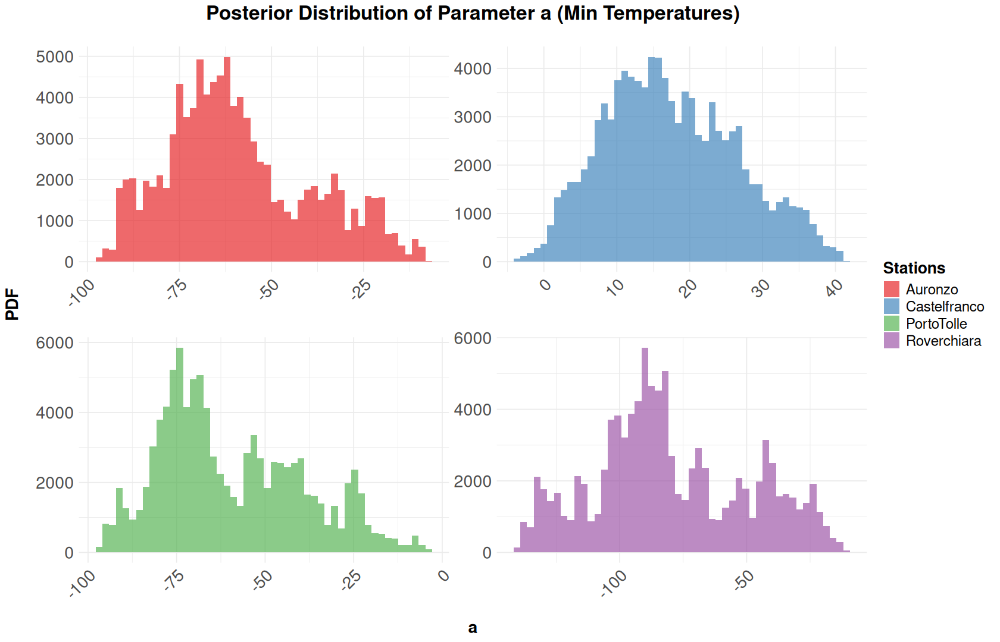

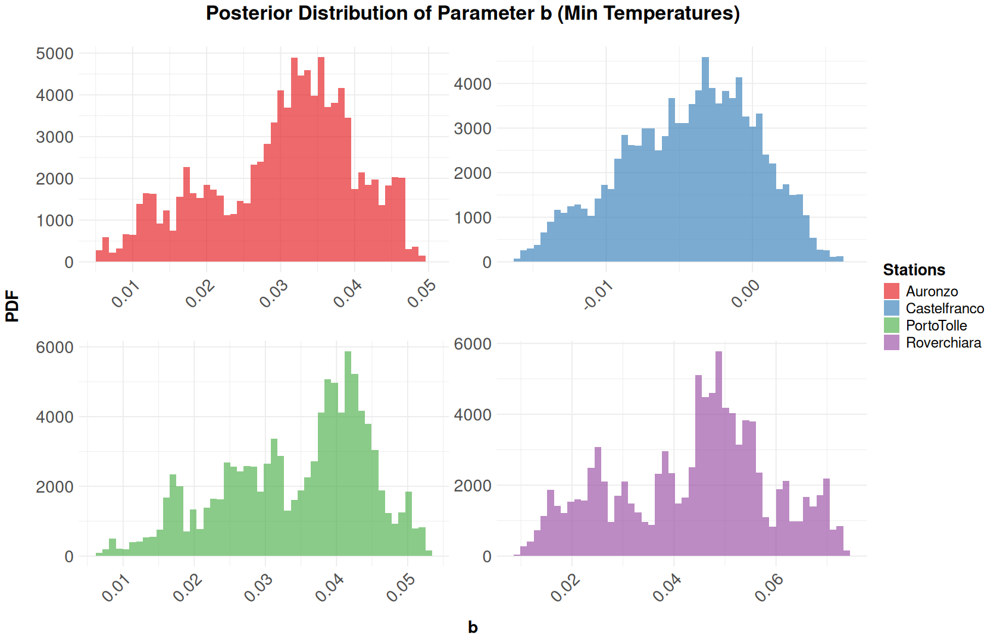

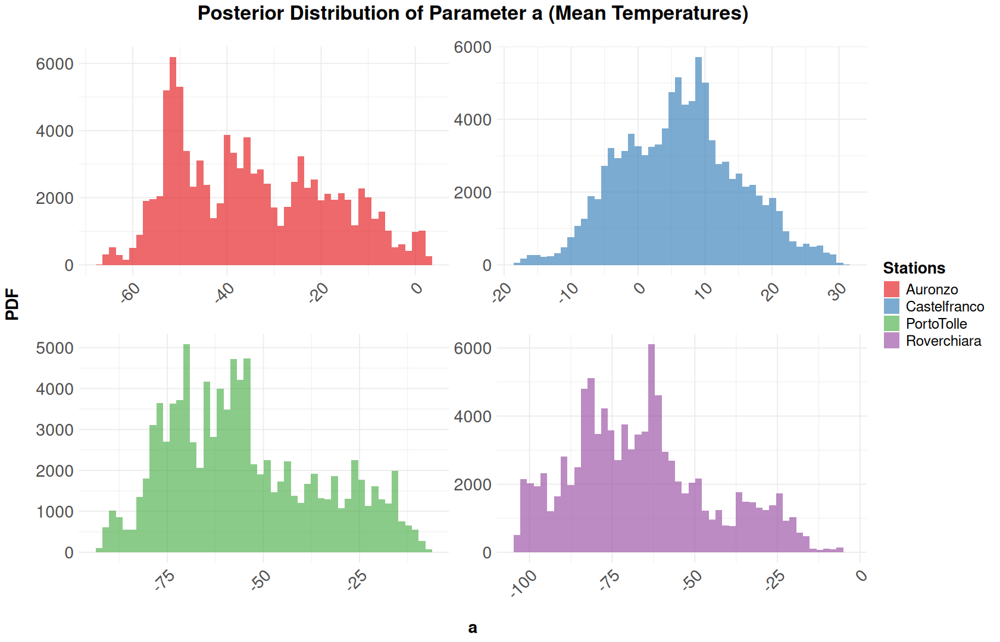

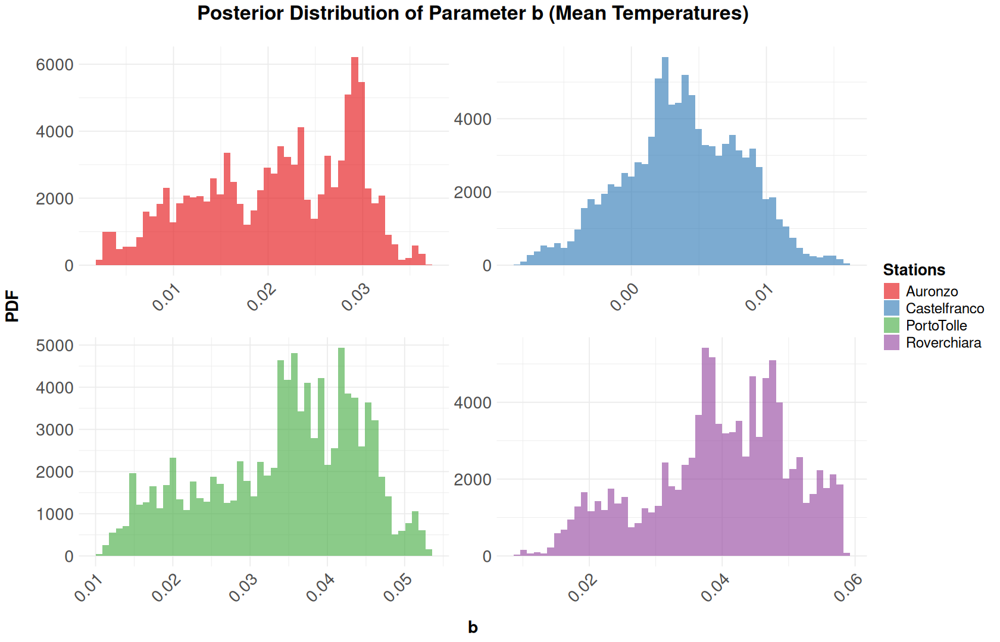

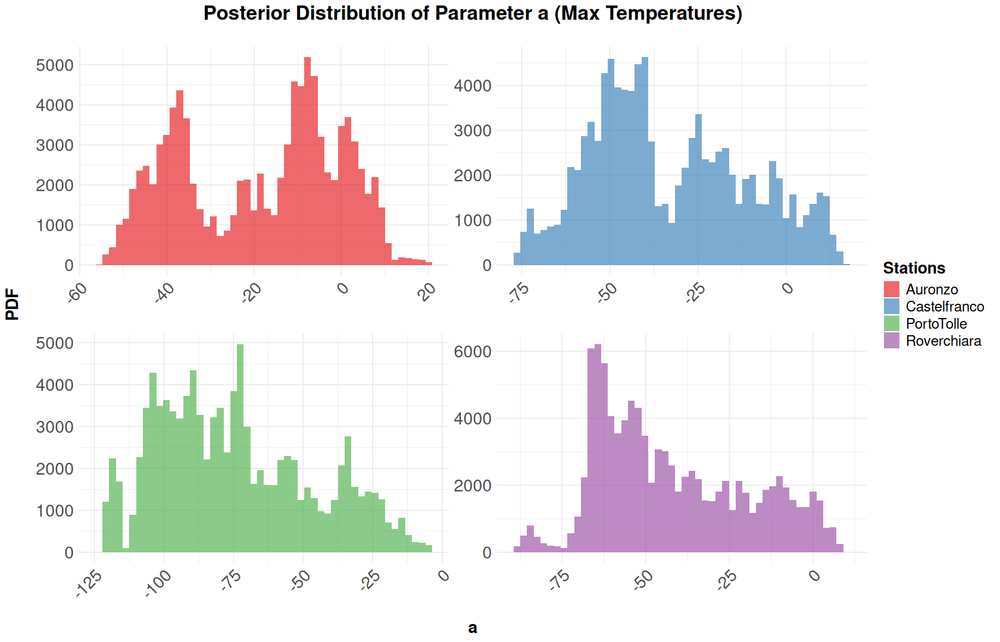

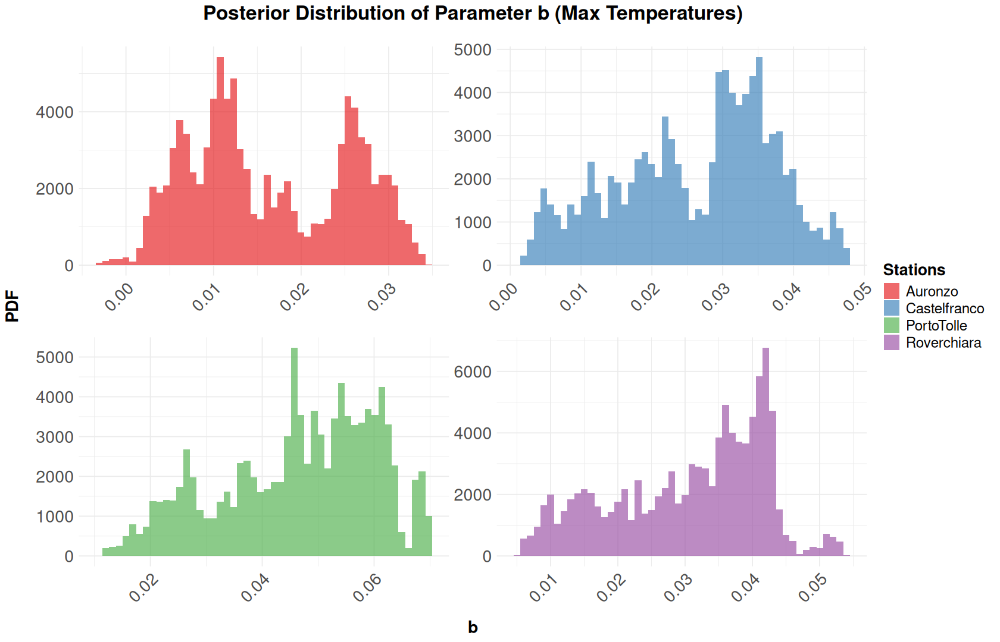

In [20]:
samples_long_min <- results$samples_jags_min %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_mean <- results$samples_jags_mean %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_max <- results$samples_jags_max %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")


options(repr.plot.width = 14, repr.plot.height=9)


theme_custom <- theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 17),
    axis.text.y = element_text(size = 17),
    axis.title.x = element_text(size = 17, face = "bold", margin = margin(t = 15)),
    axis.title.y = element_text(size = 17, face = "bold", margin = margin(r = 15)),
   # strip.text = element_text(size = 16, face = "bold"),
    legend.title = element_text(size = 16, face = "bold"),
    legend.text = element_text(size = 14.5)
  )

ggplot(filter(samples_long_min, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Min Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_min, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Min Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")


ggplot(filter(samples_long_mean, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Mean Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_mean, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Mean Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")


ggplot(filter(samples_long_max, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Max Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_max, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Max Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

In [21]:
 pred_jags_min<-results$pred_jags_min
pred_jags_mean<-results$pred_jags_mean
pred_jags_max<-results$pred_jags_max

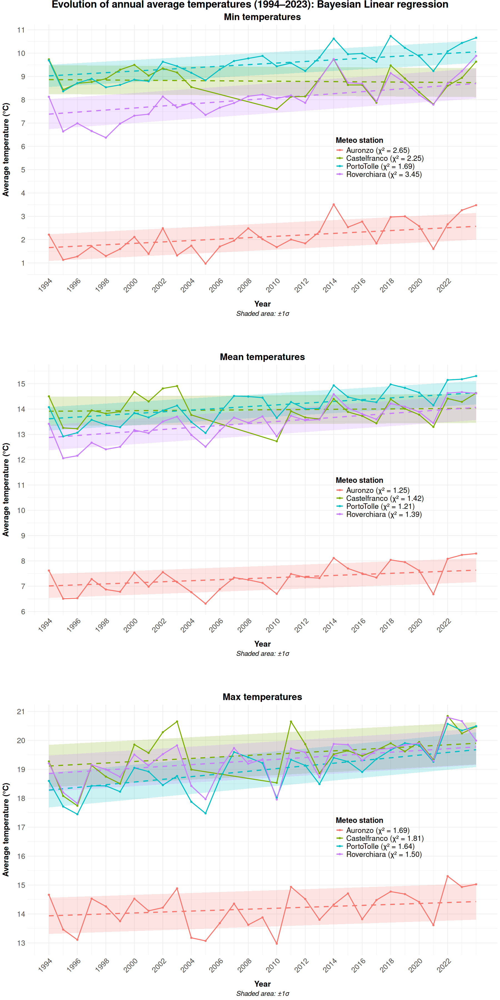

In [22]:
pred_jags_min$temp_type <- "min"
pred_jags_mean$temp_type <- "mean"
pred_jags_max$temp_type <- "max"   # merge the dataframes
pred_jags <- rbind(pred_jags_min, pred_jags_mean, pred_jags_max)

options(repr.plot.width = 15, repr.plot.height = 30)
min_lin_fit_plot <-plot_1(df_finale,pred_jags,"min",'Min temperatures',names_stat)
mean_lin_fit_plot <-plot_1(df_finale,pred_jags,"mean",'Mean temperatures',names_stat)
max_lin_fit_plot <-plot_1(df_finale,pred_jags,"max",'Max temperatures',names_stat)

grid.arrange(
  min_lin_fit_plot, nullGrob(), mean_lin_fit_plot, nullGrob(), max_lin_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): Bayesian Linear regression', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

## 1.3)
Perform the same analysis uwing a constant regression.

We now perform a constant regression analysis with JAGS to compare the two models with a Bayesian hypothesis testing. 

In [23]:
prior_min_const <- prior_min
prior_min_const$slope <- 0
prior_min_const$slope_se <- 1e6  # very vague prior on slope

prior_mean_const <- prior_mean
prior_mean_const$slope <- 0
prior_mean_const$slope_se <- 1e6

prior_max_const <- prior_max
prior_max_const$slope <- 0
prior_max_const$slope_se <- 1e6


const_results <- jags_analysis(
  model_type = "constant",
  df_min = df_min,
  df_mean = df_mean,
  df_max = df_max,
  prior_min = prior_min_const,
  prior_mean = prior_mean_const,
  prior_max = prior_max_const,
  names_stat = names_stat,
  n.chains = n.chains,
  n.burnin = n.burnin,
  n.iter = n.iter
)

const_results

paese,Anno,prediction,prediction_se,chi_squared
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,1994,8.030524,0.9014605,6.599577
Roverchiara,1995,8.030524,0.9014605,6.599577
Roverchiara,1996,8.030524,0.9014605,6.599577
Roverchiara,1997,8.030524,0.9014605,6.599577
Roverchiara,1998,8.030524,0.9014605,6.599577
Roverchiara,1999,8.030524,0.9014605,6.599577
Roverchiara,2000,8.030524,0.9014605,6.599577
Roverchiara,2001,8.030524,0.9014605,6.599577
Roverchiara,2002,8.030524,0.9014605,6.599577


In [24]:
plot_constant_fit <- function(df, pred_df, temp_type, title, names_stat) {
    
  # filter by temp type
    
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp_type == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
  df$Medio <- as.numeric(as.character(df$Medio))
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  pred_df$prediction_se <- as.numeric(as.character(pred_df$prediction_se))
  

  chi_values <- pred_df |>
    group_by(paese) |>
    summarise(chi_squared = mean(chi_squared), .groups = "drop")
  
  legend_labels <- setNames(
    sprintf("%s (χ² = %.2f)", chi_values$paese, chi_values$chi_squared),
    chi_values$paese
  )
  
  ggplot() +
    # shaded ribbon for ±1σ
    geom_ribbon(data = pred_df, aes(x = Anno, ymin = prediction - prediction_se,
                                    ymax = prediction + prediction_se, fill = paese),alpha = 0.2, show.legend = FALSE) +
    # constant prediction line
    geom_line(data = pred_df, aes(x = Anno, y = prediction, color = paese), 
              size = 1.2, linetype = "dashed") +
    
    geom_line(data = df, aes(x = Anno, y = Medio, color = paese), size = 1) +
    geom_point(data = df, aes(x = Anno, y = Medio, color = paese)) +
    
    scale_color_discrete(labels = legend_labels) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station",
      fill = NULL,
      caption = "Shaded area: ±1σ") +
    
    scale_x_continuous(breaks = seq(1994, 2023, 2)) +
    scale_y_continuous(breaks = seq(0, 21, 1)) +
    
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.8, 0.47),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16),
      plot.caption = element_text(size = 14, hjust = 0.5, face = "italic")) }


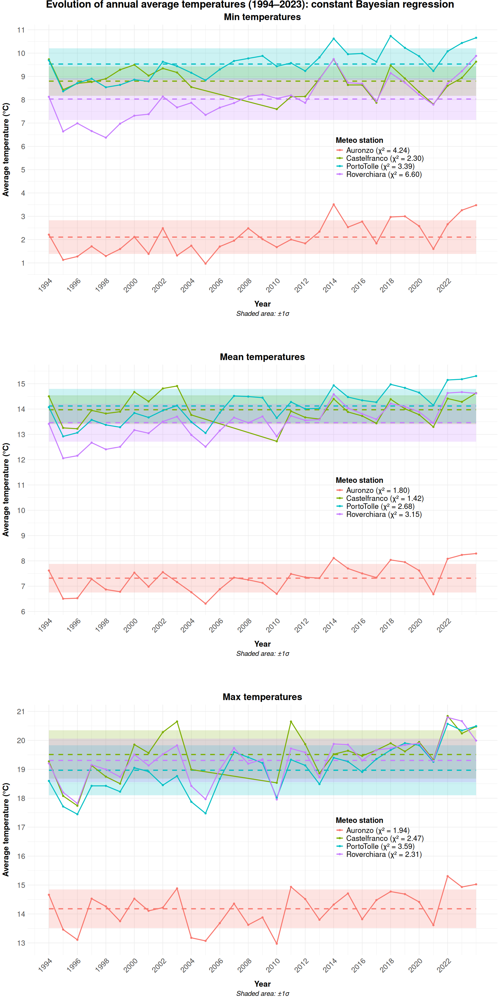

In [25]:
const_results$pred_jags_min$temp_type <- "min"
const_results$pred_jags_mean$temp_type <- "mean"
const_results$pred_jags_max$temp_type <- "max"

const_results$pred_jags <- rbind(
  const_results$pred_jags_min, 
  const_results$pred_jags_mean, 
  const_results$pred_jags_max)

options(repr.plot.width = 15, repr.plot.height = 30)

min_const_fit_plot <- plot_1(df_finale,const_results$pred_jags,"min","Min temperatures",  names_stat)
mean_const_fit_plot <-plot_1(df_finale,const_results$pred_jags,"mean",'Mean temperatures',names_stat)
max_const_fit_plot <-plot_1(df_finale,const_results$pred_jags,"max",'Max temperatures',names_stat)

grid.arrange(min_const_fit_plot, nullGrob(), mean_const_fit_plot, nullGrob(), max_const_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): constant Bayesian regression', gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" ))

## 1.4)

We now perform a Bayesian hypothesis testing with the posteriors obtained. The null hypothesis $H_0$ is the constant model, while the alternative hypothesis $H_1$ is the increasing linear trend. We can proceed in two ways.

- First, in the linear model, we compute a 95% confidence interval for the posterior of the slope b to test the null hypothesis $b=0$.

In [26]:
##

lower_lims_min <- results$samples_jags_min |> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_min <- results$samples_jags_min |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))

lower_lims_mean <- results$samples_jags_mean|> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_mean  <- results$samples_jags_mean |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))


lower_lims_max <- results$samples_jags_max |> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_max <- results$samples_jags_max |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))


lower_lims <- bind_rows("min"=lower_lims_min,'mean'=lower_lims_mean,"max"=lower_lims_max,.id='type')
upper_lims <- bind_rows("min"=upper_lims_min,'mean'=upper_lims_mean,"max"=upper_lims_max,.id='type')

lower_lims
upper_lims

type,paese,lower_lim
<chr>,<chr>,<dbl>
min,Auronzo,0.010142018
min,Castelfranco,-0.013599728
min,PortoTolle,0.013674449
min,Roverchiara,0.015036827
mean,Auronzo,0.004223118
mean,Castelfranco,-0.005142411
mean,PortoTolle,0.014551200
mean,Roverchiara,0.017237895
max,Auronzo,0.002681163


type,paese,upper_lim
<chr>,<chr>,<dbl>
min,Auronzo,0.046077044
min,Castelfranco,0.003398487
min,PortoTolle,0.050206719
min,Roverchiara,0.069961470
mean,Auronzo,0.032576526
mean,Castelfranco,0.011842286
mean,PortoTolle,0.050303627
mean,Roverchiara,0.056939332
max,Auronzo,0.031546019


With the exception of minimum and mean temperatures in Castelfranco and maximum temperatures in Auronzo, $b=0$ is not included in the confidence interval and thus in such cases we can reject the null hypothess of the constant model, at significance $\alpha=5\%$.

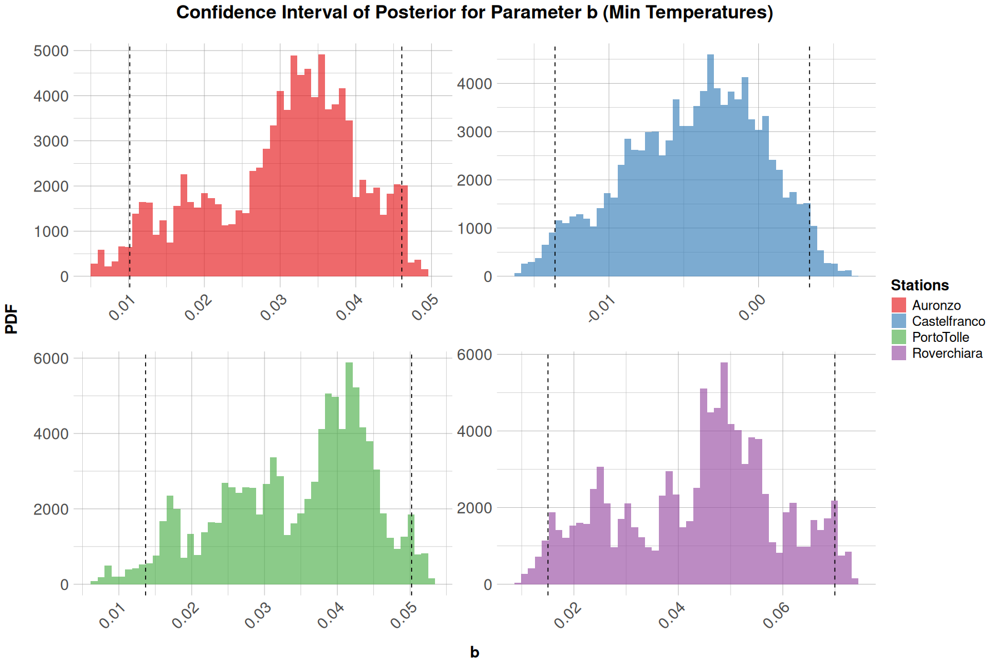

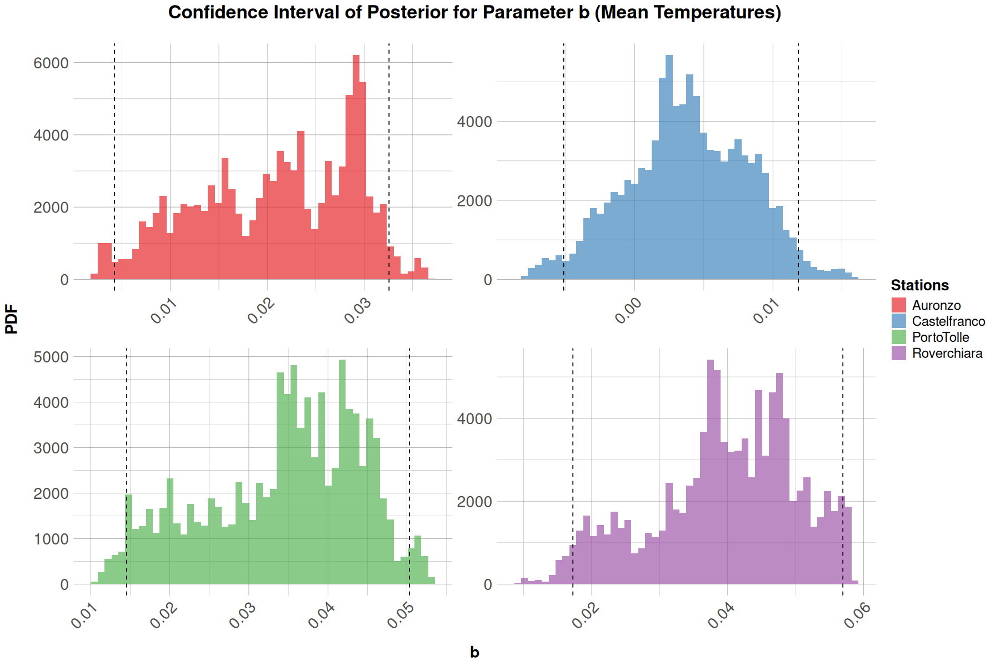

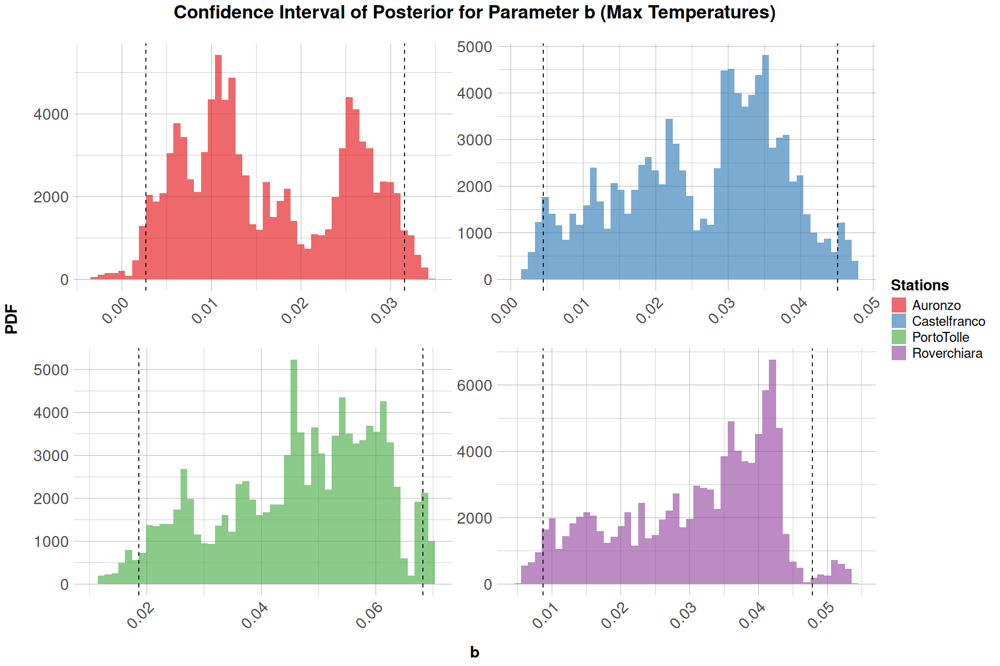

In [27]:
samples_long_min <- results$samples_jags_min %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_mean <- results$samples_jags_mean %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_max <- results$samples_jags_max %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")


theme_custom <- theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 17),
    axis.text.y = element_text(size = 17),
    axis.title.x = element_text(size = 17, face = "bold", margin = margin(t = 15)),
    axis.title.y = element_text(size = 17, face = "bold", margin = margin(r = 15)),
    legend.title = element_text(size = 16, face = "bold"),
    legend.text = element_text(size = 14.5),
    
    # grid lines
    panel.grid.major = element_line(color = "grey60", size = 0.2),
    panel.grid.minor = element_line(color = "grey75", size = 0.2))



options(repr.plot.width = 15, repr.plot.height=10)


ggplot(filter(samples_long_min, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "min"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "min"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Min Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

                                                           
ggplot(filter(samples_long_mean, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "mean"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "mean"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Mean Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")
                                                           

ggplot(filter(samples_long_max, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "max"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "max"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Max Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

- Another way to proceed is to compute the Bayes factor for the two models:
$$ BF = \frac{P(Data|H_1)}{P(Data|H_0)}$$

where we compute the likelihoods assuming a distribution $N(a+bx,\sigma^2)$ for $H_1$ and $N(a,\sigma^2)$ for $H_0$.

In [28]:
log_lik_sample <- function(a, b, sigma2, x, y) {
  x <- as.numeric(x)
  y <- as.numeric(y)
  mu <- a+ b*x
  sum(dnorm(y, mean = mu, sd = sqrt(sigma2),log = TRUE))
}

log_lik_sample_const <- function(a, sigma2, y) {
  y <- as.numeric(y)
  mu <- rep(a, length(y))
  sum(dnorm(y, mean = mu, sd = sqrt(sigma2),log = TRUE))
}


samples_linear_min <- as.data.frame(results$samples_jags_min)   
samples_const_min  <- as.data.frame(const_results$samples_jags_min)

samples_linear_min <- samples_linear_min |> filter(sigma>0)
samples_const_min <- samples_const_min |> filter(sigma>0)

samples_linear_mean <- as.data.frame(results$samples_jags_mean)   
samples_const_mean  <- as.data.frame(const_results$samples_jags_mean)

samples_linear_mean <- samples_linear_mean |> filter(sigma>0)
samples_const_mean <- samples_const_mean |> filter(sigma>0)

samples_linear_max <- as.data.frame(results$samples_jags_max)   
samples_const_max  <- as.data.frame(const_results$samples_jags_max)

samples_linear_max <- samples_linear_max |> filter(sigma>0)
samples_const_max <- samples_const_max |> filter(sigma>0)


log_marg_like <- function(log_liks) {
  m <- max(log_liks)
  m + log(mean(exp(log_liks - m)))
}


library(purrr)

stations <- unique(samples_linear_min$paese)
bf_results <- list()

for (st in stations) {
  
  s_lin_min   <- samples_linear_min |> filter(paese == st)
  s_const_min <- samples_const_min  |> filter(paese == st)

  s_lin_mean   <- samples_linear_mean |> filter(paese == st)
  s_const_mean <- samples_const_mean  |> filter(paese == st)

  s_lin_max   <- samples_linear_max |> filter(paese == st)
  s_const_max <- samples_const_max  |> filter(paese == st)

  df_station_min  <- df_min  |> filter(paese == st)
  x_min <- df_station_min$Anno
  y_min <- df_station_min$Medio

  df_station_mean <- df_mean |> filter(paese == st)
  x_mean <- df_station_mean$Anno
  y_mean <- df_station_mean$Medio

  df_station_max  <- df_max  |> filter(paese == st)
  x_max <- df_station_max$Anno
  y_max <- df_station_max$Medio

  log_liks_linear_min <- s_lin_min |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_min, y = y_min)
    }))

  log_liks_const_min <- s_const_min |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_min)
    }))

  log_liks_linear_mean <- s_lin_mean |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_mean, y = y_mean)
    }))

  log_liks_const_mean <- s_const_mean |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_mean)
    }))

  log_liks_linear_max <- s_lin_max |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_max, y = y_max)
    }))

  log_liks_const_max <- s_const_max |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_max)
    }))

  log_ml_linear_min <- log_marg_like(log_liks_linear_min$loglik)
  log_ml_const_min   <- log_marg_like(log_liks_const_min$loglik)

  log_ml_linear_mean <- log_marg_like(log_liks_linear_mean$loglik)
  log_ml_const_mean  <- log_marg_like(log_liks_const_mean$loglik)

  log_ml_linear_max  <- log_marg_like(log_liks_linear_max$loglik)
  log_ml_const_max   <- log_marg_like(log_liks_const_max$loglik)

  BF_min  <- exp(log_ml_linear_min - log_ml_const_min)
  BF_mean <- exp(log_ml_linear_mean - log_ml_const_mean)
  BF_max  <- exp(log_ml_linear_max - log_ml_const_max)

  bf_results[[st]] <- list(
    BF_min = BF_min,
    BF_mean = BF_mean,
    BF_max = BF_max
  )
}


In [29]:
bf_results <- bind_rows(lapply(names(bf_results), function(st) {
    data.frame(
      paese = st,
      BF_min = bf_results[[st]]$BF_min,
      BF_mean = bf_results[[st]]$BF_mean,
      BF_max = bf_results[[st]]$BF_max) }))
bf_results

paese,BF_min,BF_mean,BF_max
<chr>,<dbl>,<dbl>,<dbl>
Roverchiara,3.682546e+05,2.532078e+06,8.636317e+02
Castelfranco,1.388152e+00,8.855897e-01,4.914247e+01
PortoTolle,2.457810e+05,1.471476e+06,4.344401e+05
Auronzo,3.692790e+03,4.567089e+02,7.735852e+00


Coherently with previous results, a constant model $H_0$ is more likely than a linear model $H_1$ only for mean temperatures in Castelfranco, and again low values of $BF$ (not strong evidence for linear model) are obtained for minimum temperatures in Castelfranco and maximum temperatures in Auronzo. In all other cases, the linear model $H_1$ is much more likely than the constant model $H_0$. 

## 1.5)
Do you see correlations between data measured at different stations?

We calculate the correlation between minimum, mean and maximum temperatures across different pairs of stations, excluding Castelfranco Veneto due to missing data. In particular, we compute the "cumulative" correlation, considering all data up to each given day.

In [30]:
#Roverchiara-Porto Tolle

df <- df_94 |> filter(paese %in% c("Roverchiara","PortoTolle")) |> arrange(date)
df_wide <- df |> pivot_wider(names_from = paese,values_from = c(TMIN,TMED,TMAX))
dates <- unique(df$date)
n <- length(dates)

corr_df_RP <- map_dfr(2:n, function(i){

data <- df_wide[1:i, ]

tibble(
    date = df_wide$date[i],
    corr_min = cor(data$TMIN_Roverchiara, data$TMIN_PortoTolle, use = "complete.obs"),
    corr_mean = cor(data$TMED_Roverchiara, data$TMED_PortoTolle, use = "complete.obs"),
    corr_max = cor(data$TMAX_Roverchiara, data$TMAX_PortoTolle, use = "complete.obs")) })              

In [31]:
corr_df_RP

date,corr_min,corr_mean,corr_max
<date>,<dbl>,<dbl>,<dbl>
1994-01-02,1.0000000,1.0000000,-1.00000000
1994-01-03,0.9821231,0.9722129,-0.80856863
1994-01-04,0.9713297,0.7682945,-0.29518660
1994-01-05,0.8153975,0.4644701,-0.03843073
1994-01-06,0.7822183,0.8196297,0.45795943
1994-01-07,0.9039757,0.9078058,0.66575916
1994-01-08,0.9120653,0.9262801,0.77844684
1994-01-09,0.9250704,0.9356944,0.80381631
1994-01-10,0.9288263,0.9330374,0.80241838


In [32]:
#Roverchiara-Auronzo

df <- df_94 |> filter(paese %in% c("Roverchiara","Auronzo")) |> arrange(date)
df_wide <- df |> pivot_wider(names_from = paese,values_from = c(TMIN,TMED,TMAX))
dates <- unique(df$date)
n<- length(dates)

corr_df_RA <- map_dfr(2:n, function(i) {

data <- df_wide[1:i, ]

tibble(
    date = df_wide$date[i],
    corr_min = cor(data$TMIN_Roverchiara, data$TMIN_Auronzo, use = "complete.obs"),
    corr_mean = cor(data$TMED_Roverchiara, data$TMED_Auronzo, use = "complete.obs"),
    corr_max = cor(data$TMAX_Roverchiara, data$TMAX_Auronzo, use = "complete.obs") )
})              

In [33]:
corr_df_RA

date,corr_min,corr_mean,corr_max
<date>,<dbl>,<dbl>,<dbl>
1994-01-02,1.0000000,1.0000000,-1.0000000
1994-01-03,0.6105720,0.9018759,0.5801178
1994-01-04,0.6991804,0.7690111,0.6182627
1994-01-05,0.7750287,0.7666076,0.2639864
1994-01-06,0.8786998,0.8318292,0.2824936
1994-01-07,0.9007856,0.8244284,0.3491032
1994-01-08,0.9154826,0.8620333,0.6425713
1994-01-09,0.8759032,0.8622717,0.6748990
1994-01-10,0.8739255,0.8670574,0.6789171


In [34]:
#Porto Tolle-Auronzo

df <- df_94 |> filter(paese %in% c("PortoTolle","Auronzo")) |> arrange(date)
df_wide <- df |> pivot_wider(names_from = paese,values_from = c(TMIN,TMED,TMAX))
dates <- unique(df$date)
n <- length(dates)

corr_df_PA <- map_dfr(2:n, function(i) {

data <- df_wide[1:i,]

tibble(
    date = df_wide$date[i],
    corr_min = cor(data$TMIN_PortoTolle, data$TMIN_Auronzo, use = "complete.obs"),
    corr_mean = cor(data$TMED_PortoTolle, data$TMED_Auronzo, use = "complete.obs"),
    corr_max = cor(data$TMAX_PortoTolle, data$TMAX_Auronzo, use = "complete.obs") )
})              

In [35]:
corr_df_PA

date,corr_min,corr_mean,corr_max
<date>,<dbl>,<dbl>,<dbl>
1994-01-02,1.0000000,1.0000000,1.00000000
1994-01-03,0.7487354,0.7756860,0.01020749
1994-01-04,0.8027971,0.7913590,0.17987235
1994-01-05,0.5167912,0.1722997,-0.57662877
1994-01-06,0.5709158,0.5547950,-0.34650394
1994-01-07,0.7149319,0.6883950,-0.15221395
1994-01-08,0.7532027,0.7504990,0.27494978
1994-01-09,0.7461789,0.7667472,0.33839342
1994-01-10,0.7458763,0.7670139,0.33879674


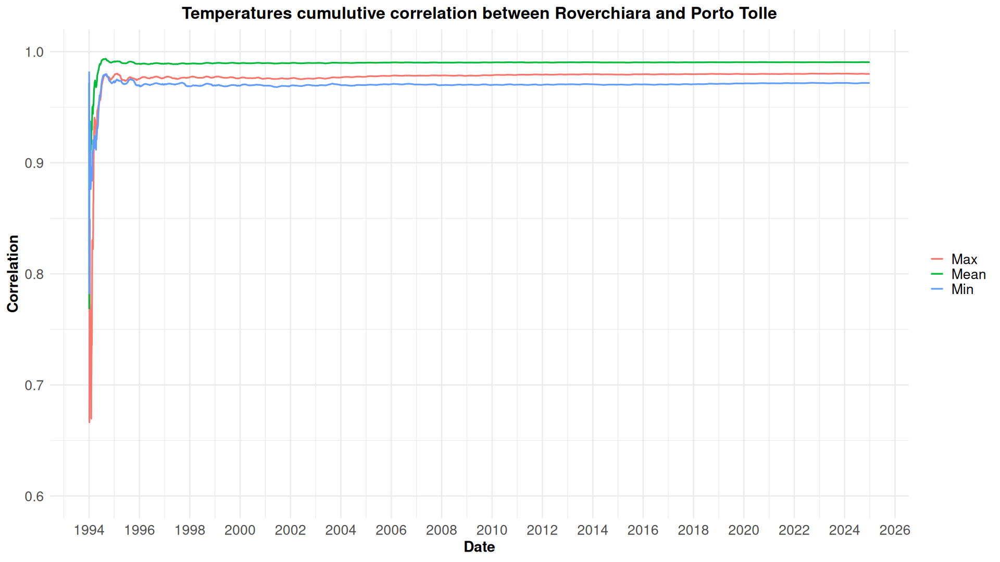

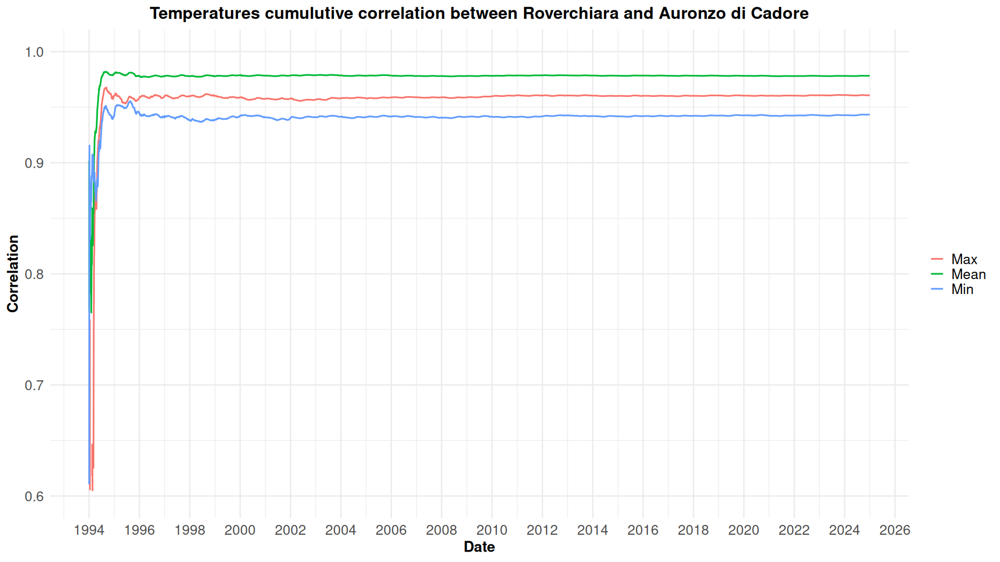

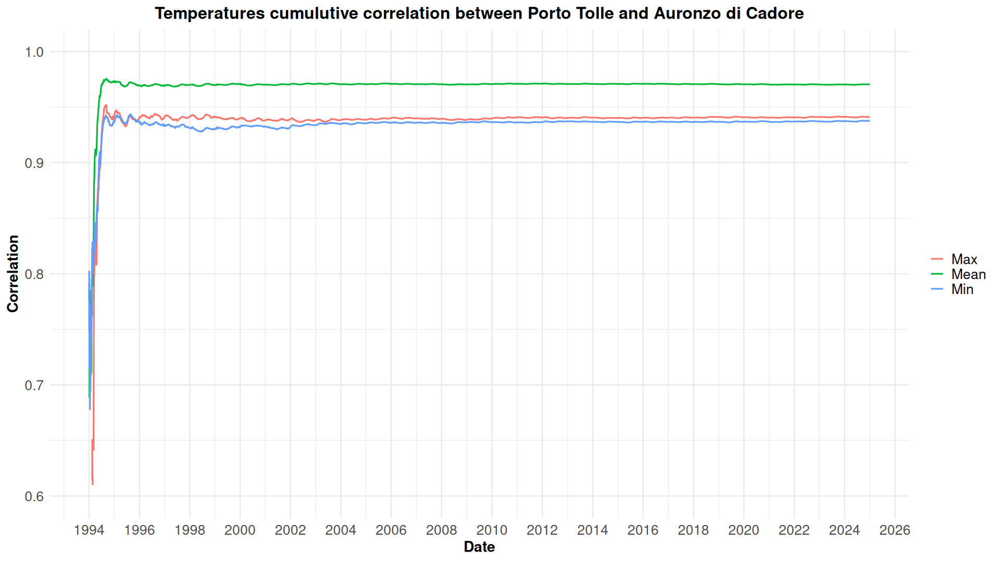

In [36]:
#plots

corr_df_long_RP <- corr_df_RP |> filter(corr_min!=1) |>
  mutate(date = dates[2:length(corr_df_PA$corr_min)]) |>
  pivot_longer(cols = c(corr_min, corr_mean, corr_max),
               names_to = "type", values_to = "correlation")

corr_df_long_RA <- corr_df_RA |> filter(corr_min!=1) |>
  mutate(date = dates[2:length(corr_df_PA$corr_min)]) |>
  pivot_longer(cols = c(corr_min, corr_mean, corr_max),
               names_to = "type", values_to = "correlation")

corr_df_long_PA <- corr_df_PA |> filter(corr_min!=1) |>
  mutate(date = dates[2:length(corr_df_PA$corr_min)]) |>
  pivot_longer(cols = c(corr_min, corr_mean, corr_max),
               names_to = "type", values_to = "correlation")


theme_custom <- theme_minimal(base_size = 16) + 
  theme(
    plot.title = element_text(face = "bold", hjust = 0.5),
    axis.text = element_text(size = 16),
    axis.title = element_text(size = 17,face="bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 16))
   # legend.position = "bottom")

options(repr.plot.width = 16, repr.plot.height=9)

ggplot(corr_df_long_RP, aes(x = date, y = correlation, color = type)) +
  geom_line(size = 0.9) +
scale_color_discrete(
    labels = c("corr_min" = "Min", "corr_mean" = "Mean", "corr_max" = "Max"))+
  scale_y_continuous(limits = c(0.6, 1), breaks = seq(0, 1, 0.1)) +  
  scale_x_date(date_breaks = "2 years", date_labels = "%Y") +    
  labs(
    title = "Temperatures cumulutive correlation between Roverchiara and Porto Tolle",
    x = "Date",
    y = "Correlation",
    color = "Temperature"
  ) + theme_custom

ggplot(corr_df_long_RA, aes(x = date, y = correlation, color = type)) +
  geom_line(size = 0.9) +
 scale_color_discrete(
    labels = c("corr_min" = "Min", "corr_mean" = "Mean", "corr_max" = "Max"))+
  scale_y_continuous(limits = c(0.6, 1), breaks = seq(0, 1, 0.1)) +  
  scale_x_date(date_breaks = "2 years", date_labels = "%Y") +    
  labs(
    title = "Temperatures cumulutive correlation between Roverchiara and Auronzo di Cadore",
    x = "Date",
    y = "Correlation",
    color = "Temperature"
  ) + theme_custom

ggplot(corr_df_long_PA, aes(x = date, y = correlation, color = type)) +
  geom_line(size = 0.9) +
    scale_color_discrete(
    labels = c("corr_min" = "Min", "corr_mean" = "Mean", "corr_max" = "Max"))+
  scale_y_continuous(limits = c(0.6, 1), breaks = seq(0, 1, 0.1)) +  
  scale_x_date(date_breaks = "2 years", date_labels = "%Y") +    
  labs(
    title = "Temperatures cumulutive correlation between Porto Tolle and Auronzo di Cadore",
    x = "Date",
    y = "Correlation",
    color = "Temperature"
  ) + theme_custom


As expected, given the relatively short distance between the stations on a weather and climate scale, temperatures are highly correlated across them. Roverchiara and Porto Tolle exhibit the strongest correlation, as they are the closest geographically, while the correlation between Porto Tolle and Auronzo di Cadore is slightly lower, likely due to the greater distance and the distinct geographic settings (Porto Tolle being near the coast and Auronzo located in the mountains).

# 2) Analysis of the evolution of the annual difference of the min, max and daily average temperature over time (1993 - 2021):
- assuming you found an increasing trend in the temperature, compute it considering 4-years intervals and compare the results with those shown in SNPA (Sistema Nazionale per la Protezione Ambiente) in [1].

As seen previously, there is a clear increasing trend for the temperature over the years. We now want to compute it considering the residuals with respect to the absolute mean (computed over all datapoints). 

In [37]:
## version without 'Medio mensile'

df_anni <- df_finale %>% 
  filter(Anno != "Medio mensile") %>%
  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))

df_min <- df_anni %>% 
  filter(tipo == "min")
df_max <- df_anni %>% 
  filter(tipo == "max")
df_mean <- df_anni %>% 
  filter(tipo == "mean")

head(df_anni)
paesi <- unique(df_anni$paese)
tipi <- unique(df_anni$tipo)

paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,std
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995,1.766283
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837,2.112294
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319,2.382074
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853,1.915043
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163,2.141889
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064,2.376033


In [38]:
# this function computes residuals for each year
compute_residuals <- function(data, paese = NULL, tipo) {
  # paese filtering
  if (!is.null(paese)) {
    data <- data[data$paese == paese, ]
  }

  all_years <- seq(min(data$Anno), max(data$Anno), 1)

  # tipo filtering
  sel_data <- data[data$tipo == tipo, ]

  if (nrow(sel_data) == 0) {
    return(rep(NA, length(all_years)))
  }

  months <- c("GEN","FEB","MAR","APR","MAG","GIU","LUG","AGO","SET","OTT","NOV","DIC")

  yearly_average <- rowMeans(sel_data[, months], na.rm = TRUE) # average temperature for each year

  tot_average <- mean(as.matrix(sel_data[, months]), na.rm = TRUE) # total average on all years

  residuals <- rep(NA, length(all_years)) # prepare residual vector
  names(residuals) <- all_years

  matched_idx <- match(sel_data$Anno, all_years) # map existing data to years

  residuals[matched_idx] <- yearly_average - tot_average # compute residuals

  return(residuals)
}

In [39]:
# store results
n_rows <- length(paesi) * length(tipi)
years <- seq(min(df_anni$Anno), max(df_anni$Anno), 1)
#length(years)
df_residuals <- data.frame(matrix(0, nrow = n_rows, ncol = 2 + length(years)))
colnames(df_residuals) <- c("paese", "tipo", years)

# row counter
row_idx <- 1

# for over paesi
for (i in 1:length(paesi)){
    # for over tipi
    for (j in 1:length(tipi)){
        sel_paese <- paesi[i]
        sel_tipo <- tipi[j]

        # compute residuals and save
        residuals <- compute_residuals(df_anni,sel_paese,sel_tipo)
        df_residuals[row_idx, 1] <- sel_paese
        df_residuals[row_idx, 2] <- sel_tipo
        df_residuals[row_idx, 3:ncol(df_residuals)] <- residuals
        row_idx <- row_idx + 1
    }
}
df_residuals

paese,tipo,1994,1995,1996,1997,1998,1999,2000,2001,⋯,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,min,0.10125585,-0.9808870,-0.83564690,-0.40030197,-0.81682846,-0.51409997,0.003374363,-0.72349468,⋯,0.42095891,0.661927117,-0.27616353,0.8584721,0.88708731,0.4670902,-0.51144572,0.5461833,1.1494235,1.3660349
Auronzo,mean,0.29938786,-0.8142860,-0.79370544,-0.03800158,-0.44999093,-0.53874906,0.215943856,-0.33819441,⋯,0.38089196,0.184940356,0.02007440,0.7191234,0.63115723,0.2996011,-0.63839260,0.7637446,0.9169126,0.9712369
Auronzo,max,0.48209435,-0.7201600,-1.07325238,0.34812850,0.07993981,-0.43222928,0.347428218,-0.07230253,⋯,0.52813874,-0.362677480,0.29953331,0.5927881,0.50586723,0.2341107,-0.56767795,1.1259102,0.7507008,0.8433102
Castelfranco,min,0.93533437,-0.3663681,-0.09429666,-0.03700946,0.10120098,0.49032989,0.698310866,0.23608321,⋯,-0.16321338,-0.163308217,-0.92466883,0.6744914,0.11582296,-0.4647481,-0.99012902,-0.1984540,0.1422500,0.8349077
Castelfranco,mean,0.53011760,-0.7168192,-0.75031778,-0.02460590,-0.14922444,-0.07630681,0.702872802,0.32705181,⋯,-0.08660539,-0.244219337,-0.53611896,0.4163532,0.03905602,-0.1950295,-0.67794563,0.4422400,0.3113958,0.6584874
Castelfranco,max,-0.24268436,-1.4348554,-1.77392410,-0.37978754,-0.76723505,-1.01052870,0.339849538,0.05043520,⋯,0.12822514,-0.050404448,0.14796144,0.3856845,0.10315319,0.4289980,-0.18490722,1.3263927,0.7245116,0.9638268
PortoTolle,min,0.15113358,-1.1753587,-0.82355540,-0.63514074,-1.00224344,-0.90056381,-0.676197846,-0.74649512,⋯,0.41760718,0.448325390,0.09189779,1.1977513,0.69040410,0.3301383,-0.30519578,0.5401614,0.8963928,1.1216717
PortoTolle,mean,-0.05381860,-1.2086781,-1.06320402,-0.55400777,-0.75451309,-0.84584680,-0.282999128,-0.45950487,⋯,0.34647024,0.215398145,0.14105526,0.8471471,0.70907736,0.5206313,0.01758819,1.0201312,1.0509284,1.1772553
PortoTolle,max,-0.37818994,-1.2617010,-1.52901429,-0.54778864,-0.54767092,-0.74935162,0.075302540,-0.05424546,⋯,0.29160624,-0.070141780,0.37948095,0.6907764,0.92885479,0.8557460,0.28420061,1.5953155,1.3648304,1.5164442


In [48]:
# function for plotting the results
plot_residuals <- function(df_residuals, paese, tipo){
    data <- df_residuals[df_residuals$paese == paese & df_residuals$tipo == tipo,]
    x <- as.numeric(names(data)[3:length(names(data))])
    y <- as.matrix(data[1,3:ncol(data)])

    # setup color
    tipo_colors <- c("min" = "blue", "mean" = "darkgreen", "max" = "red")
    line_color <- tipo_colors[tipo]
    
    options(repr.plot.width = 8, repr.plot.height = 5)
    plot(x, y, type = 'l', main = paste('residuals of',paese,tipo,'temperature'),
        lwd = 3, xlab = 'years', ylab = 'residuals', col = line_color)
    abline(h=0, lty = 'dotted', col = 'black', alpha = 1)
    grid(col = 'gray', lty = 'dotted')
}

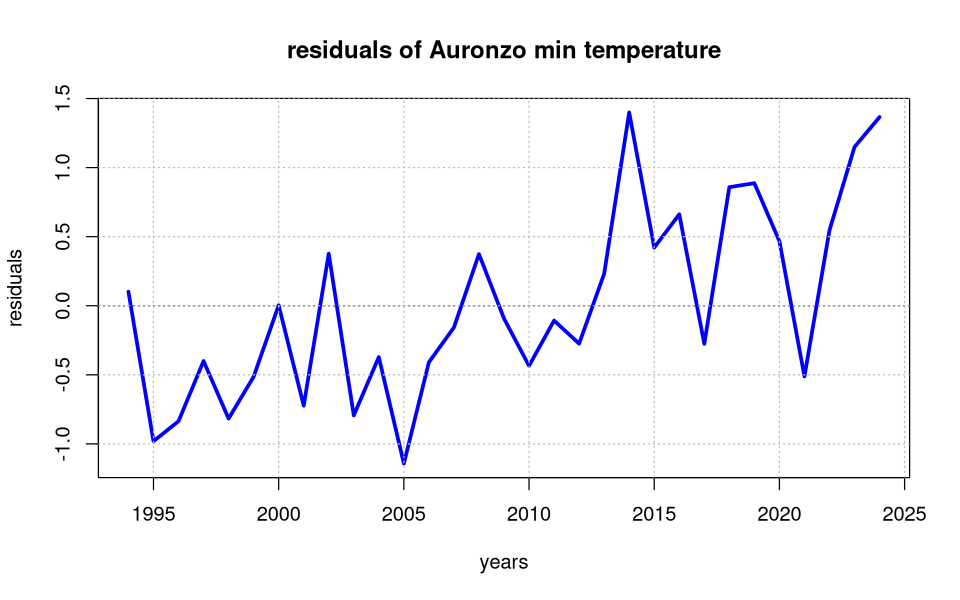

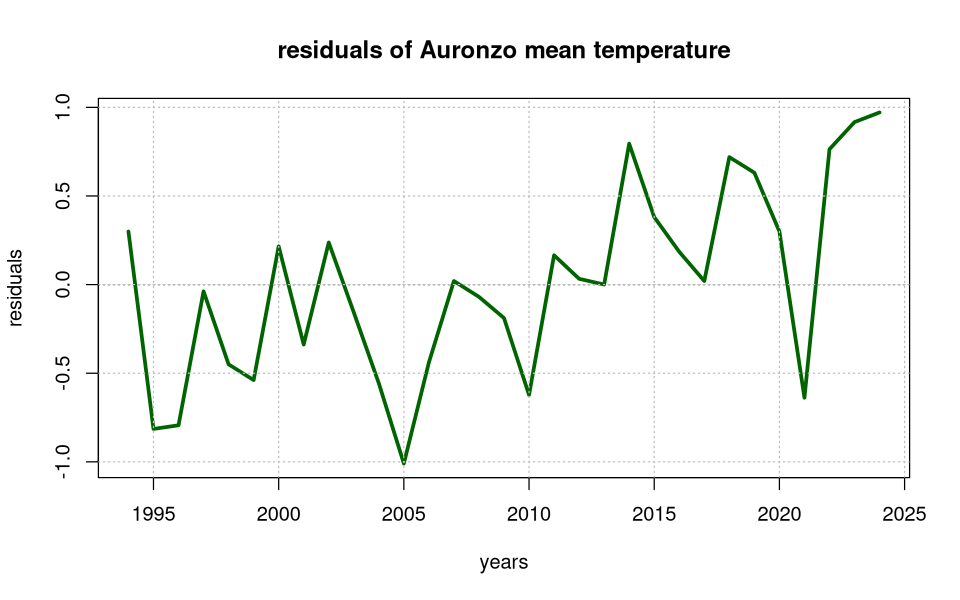

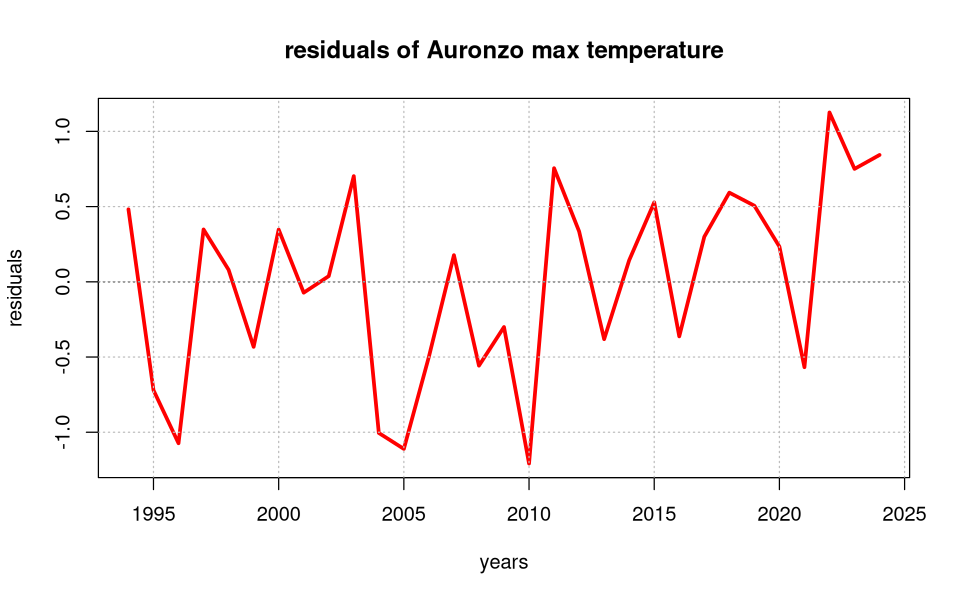

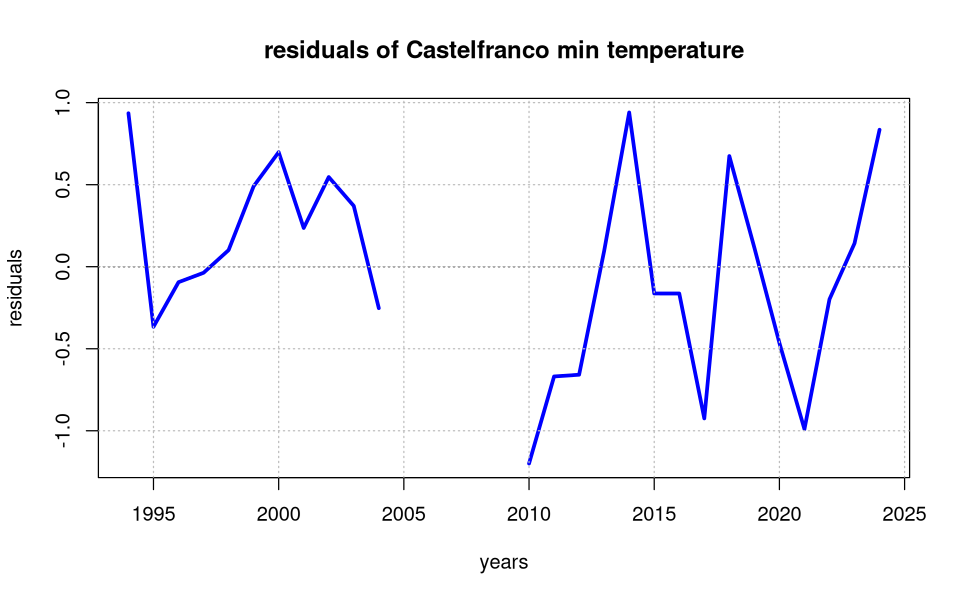

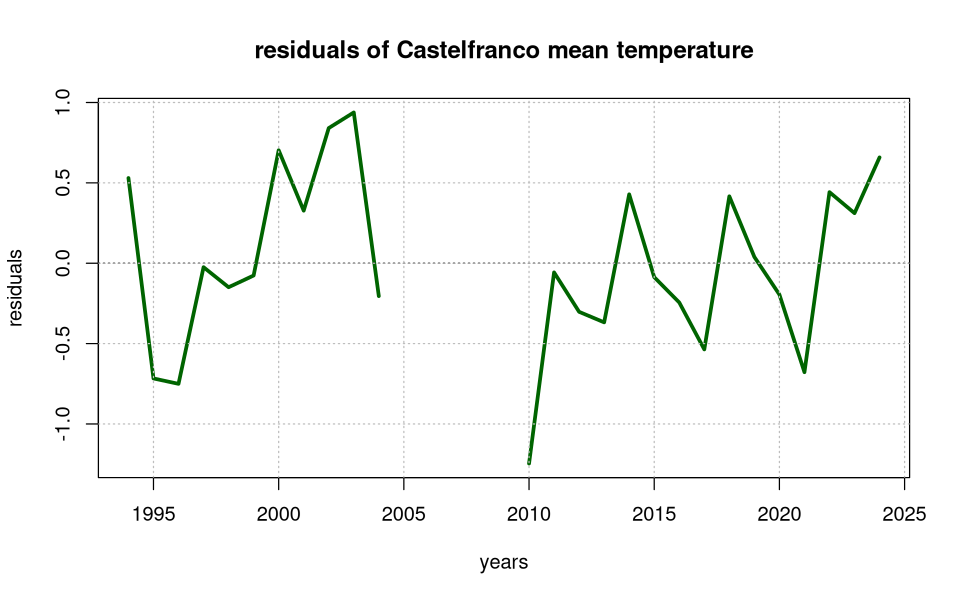

...

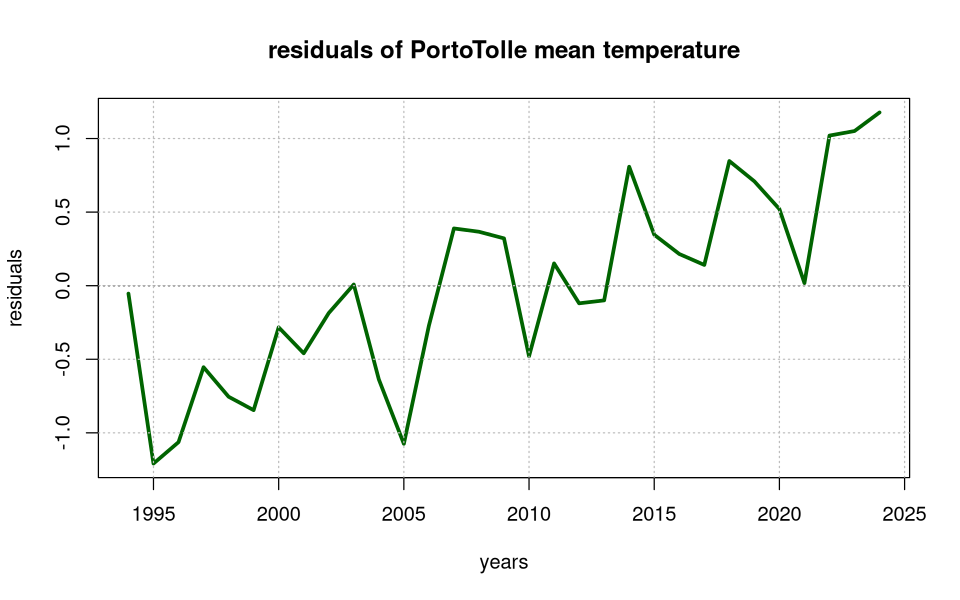

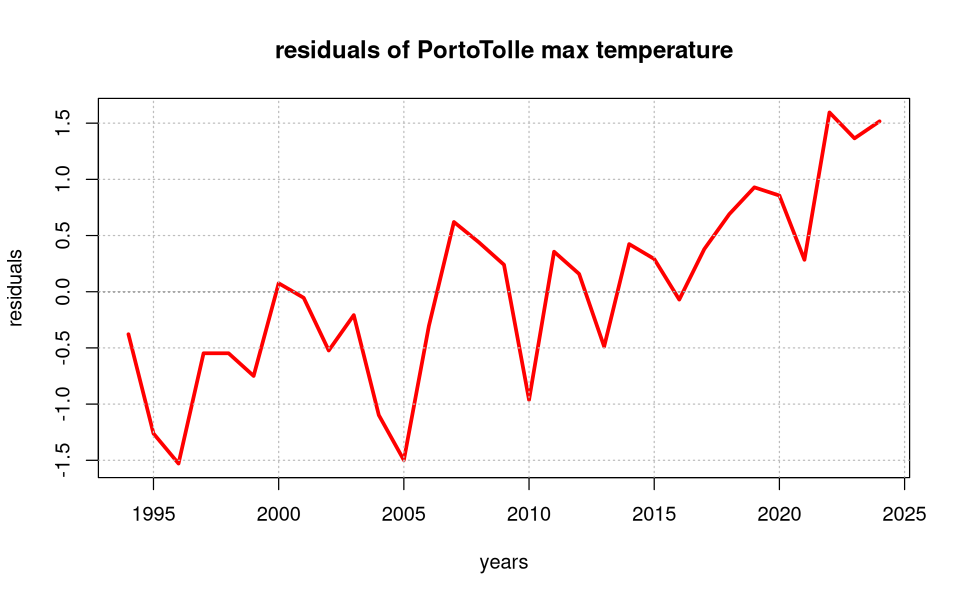

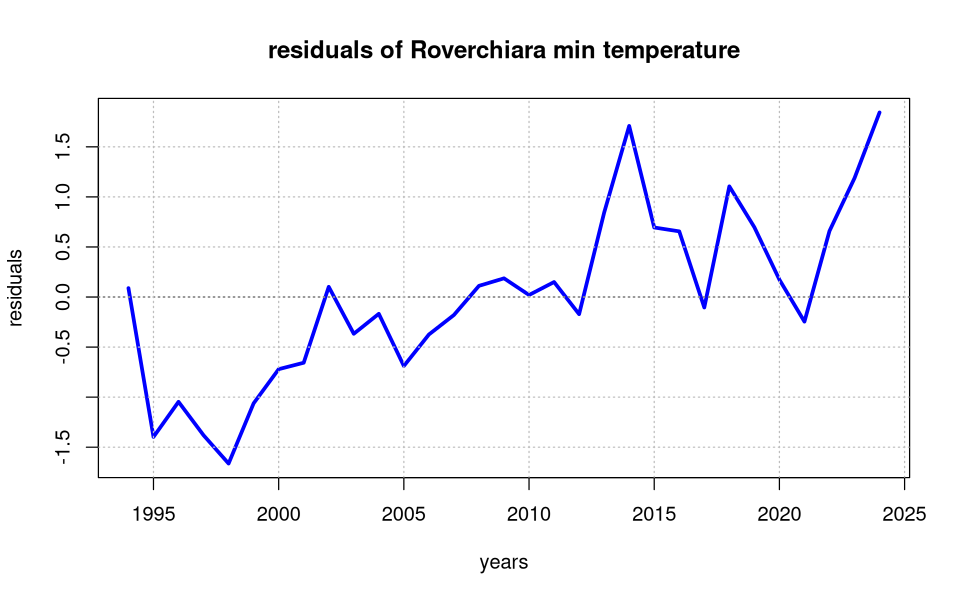

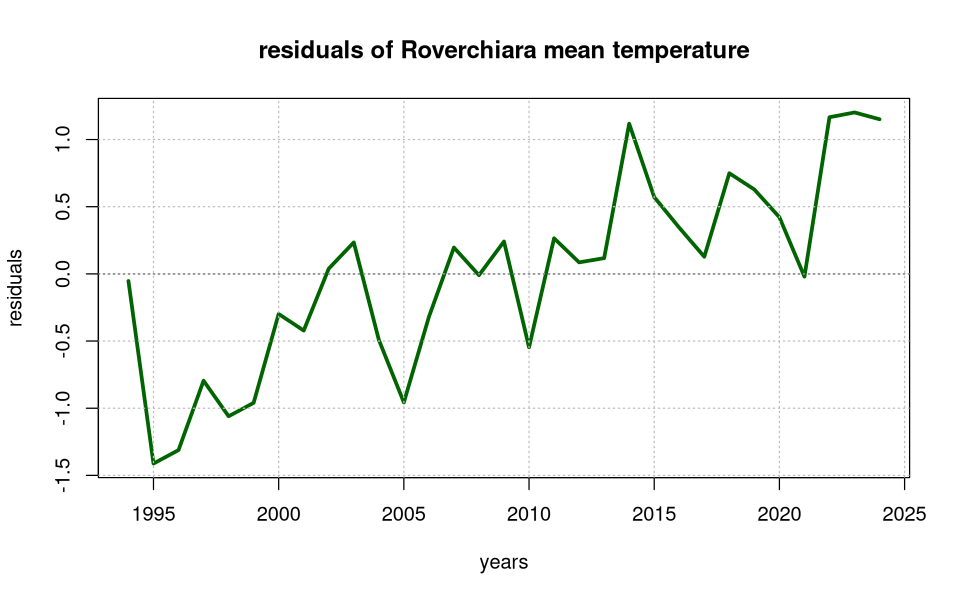

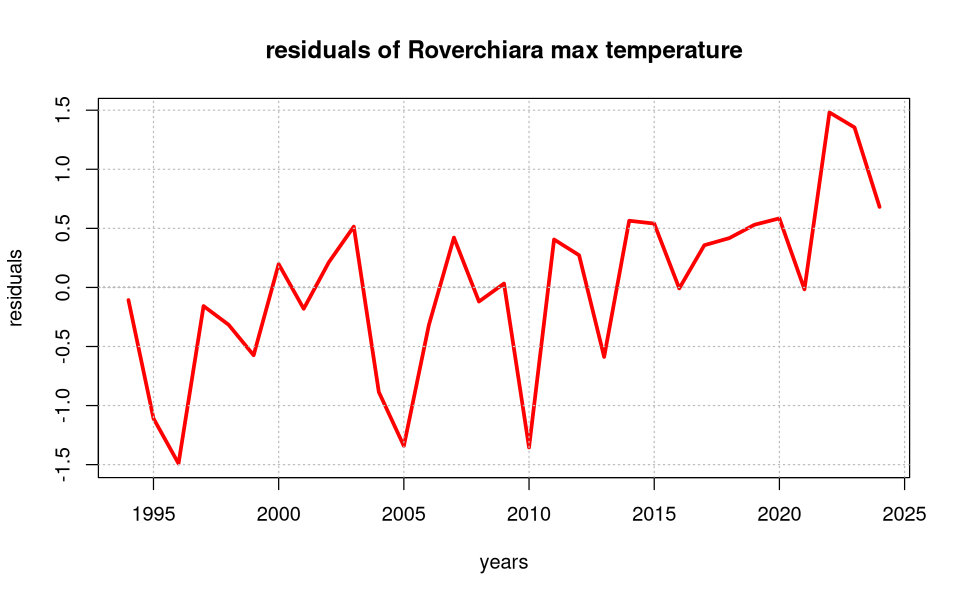

In [49]:
# plot logic 
for (paese in paesi){
    for (tipo in tipi){
        plot_residuals(df_residuals, paese, tipo)
    }
}    
  

Now we make a comparison with SNPA results:
https://www.snpambiente.it/wp-content/uploads/2021/06/Rapporto-SNPA-21_2021.pdf

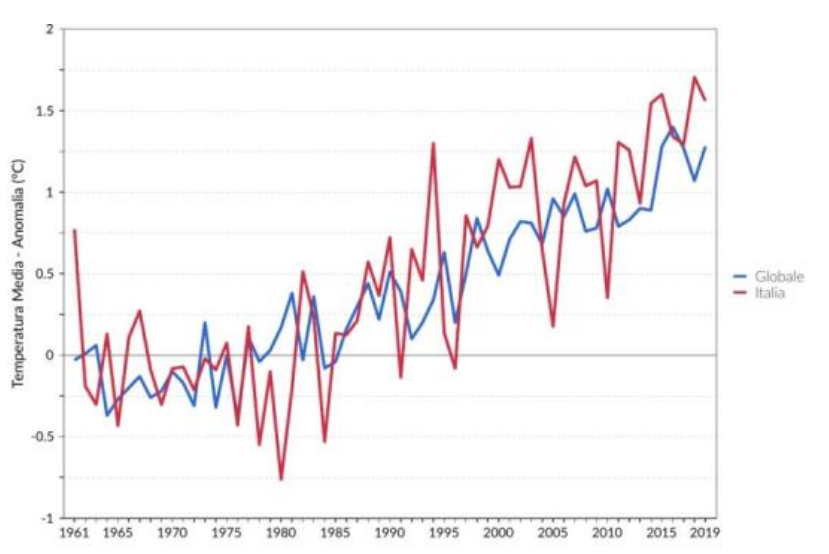

In [46]:
library("IRdisplay")
display_png(file = "/home/samu/AdvStats/Project/SNPA.png", width = 600)

Roughly speaking, we see that the overall trend of SNPA data is the same we find in our plots (in particular in Roverchiara and Porto Tolle plots), with a clear growth over time of the temperature anomaly. The comparsion between our results and SNPA is not very meaningful, since the datasets present major differences (for example, SNPA data relates to many more geographical zones). We can provide a qualitative comparison by estimating the average increase of temperature over the years according to SNPA and from a linear fit with JAGS

According to SNPA; the variation of the average temperature over the years from 1981 to 2019 is, every 10 years, equal to $\Delta T/10 Y = + 0.38 \pm 0.05\,^\circ\mathrm{C}$

In [50]:
dt_estimates <- c()
dt_errors <- c()
for (paese in paesi){
    data <- results$samples_jags_mean[results$samples_jags_mean$paese == paese,]
    b <- data[,'b']
    dt_estimate <- mean(b) * 10
    dt_error <- sd(b) * 10
    cat('For',paese,'mean temperature increase in 10 years is, on JAGS \n')
    cat(dt_estimate,'+-',dt_error,'\n\n')

    # save results
    dt_estimates <- c(dt_estimates,dt_estimate)
    dt_errors <- c(dt_errors,dt_error)
}

For Auronzo mean temperature increase in 10 years is, on JAGS 
0.207875 +- 0.08071118 

For Castelfranco mean temperature increase in 10 years is, on JAGS 
0.03824296 +- 0.04391481 

For PortoTolle mean temperature increase in 10 years is, on JAGS 
0.3428845 +- 0.0984743 

For Roverchiara mean temperature increase in 10 years is, on JAGS 
0.3966512 +- 0.1062034 



According to JAGS simulations, the results for the increase of temperature depend on the zone:

- Auronzo:
$\Delta T/10 Y = + 0.22 \pm 0.08\,^\circ\mathrm{C}$
- Castelfranco:
$\Delta T/10 Y = - 0.003 \pm 0.047\,^\circ\mathrm{C}$
- Porto Tolle:
$\Delta T/10 Y = + 0.37 \pm 0.11\,^\circ\mathrm{C}$
- Roverchiara:
$\Delta T/10 Y = + 0.40 \pm 0.12\,^\circ\mathrm{C}$

We will exclude the result for Castelfranco, since some data is missing and fit results could be misleading. We want to check if these values are compatible with SNPA value

In [51]:
SNPA_estimate <- 0.38
SNPA_error <- 0.05
SNPA_n <- 2019 - 1981
dt_n <- length(years)

# compute t-statistic
t.stat <- (SNPA_estimate - dt_estimates) / sqrt((SNPA_error^2) + dt_errors^2)

# degrees of freedom
df <- ( (SNPA_error^2/SNPA_n + dt_errors^2/dt_n)^2 ) / 
      ( ((SNPA_error^2/SNPA_n)^2)/(SNPA_n-1) + ((dt_errors^2/dt_n)^2)/(dt_n-1) )

# p value
p.value <- 2 * pt(-abs(t.stat), df)

# 0.05 significance test
cat('Stations for which the estimate is compatible: \n')
paesi[which(p.value > 0.05)]

Stations for which the estimate is compatible: 


[1] "Auronzo"     "PortoTolle"  "Roverchiara"

As expected, the results are compatible for all the stations we have enough data for at a 95% CL. We then provide a monthly plot of the increasing temperature, grouping the values of 4 years each, to give one more visualization of the increment

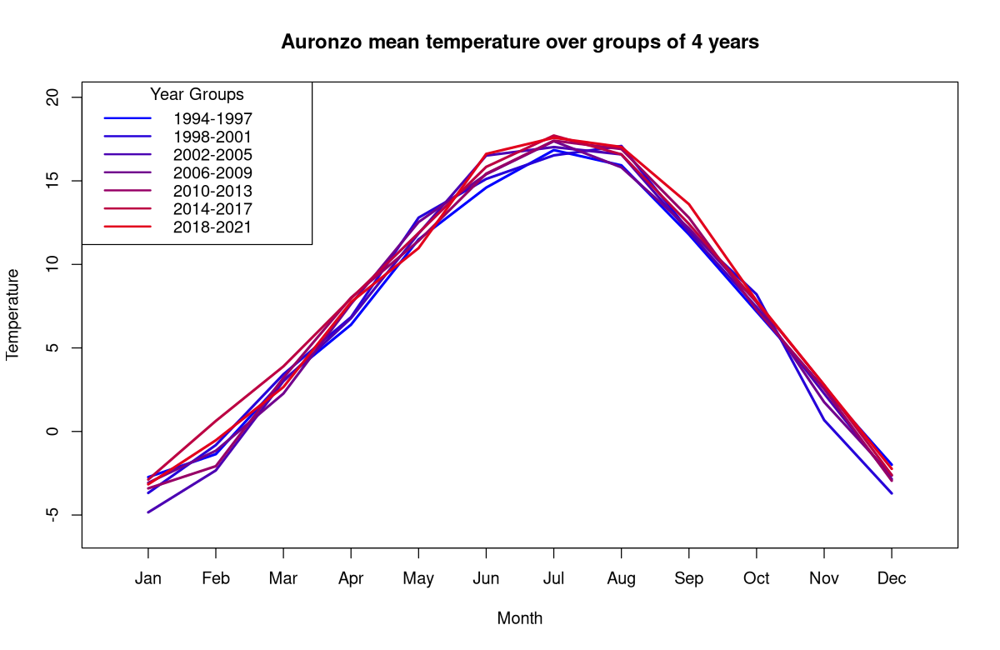

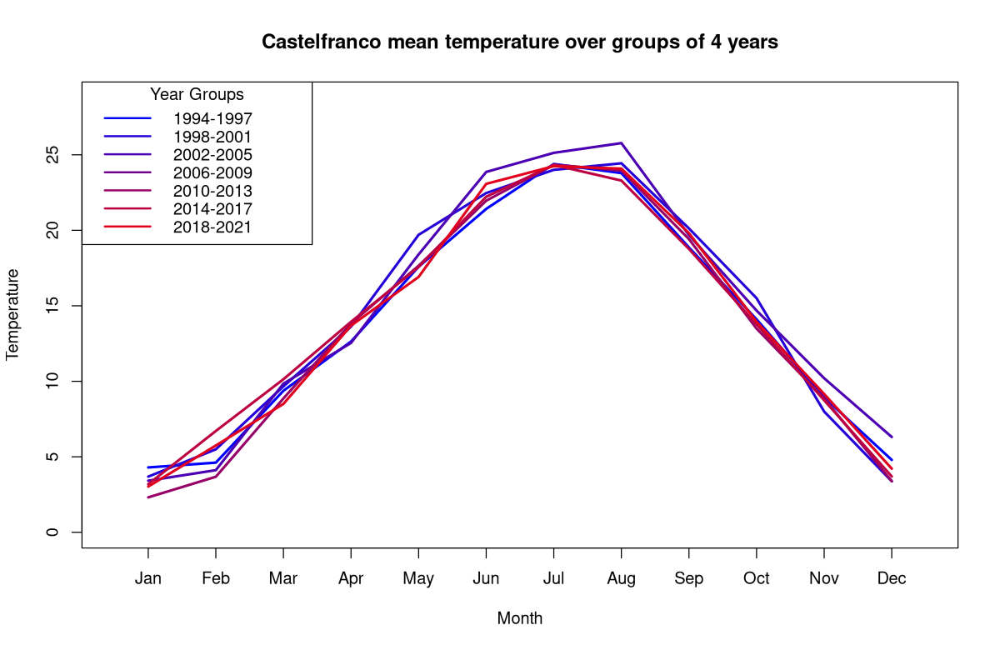

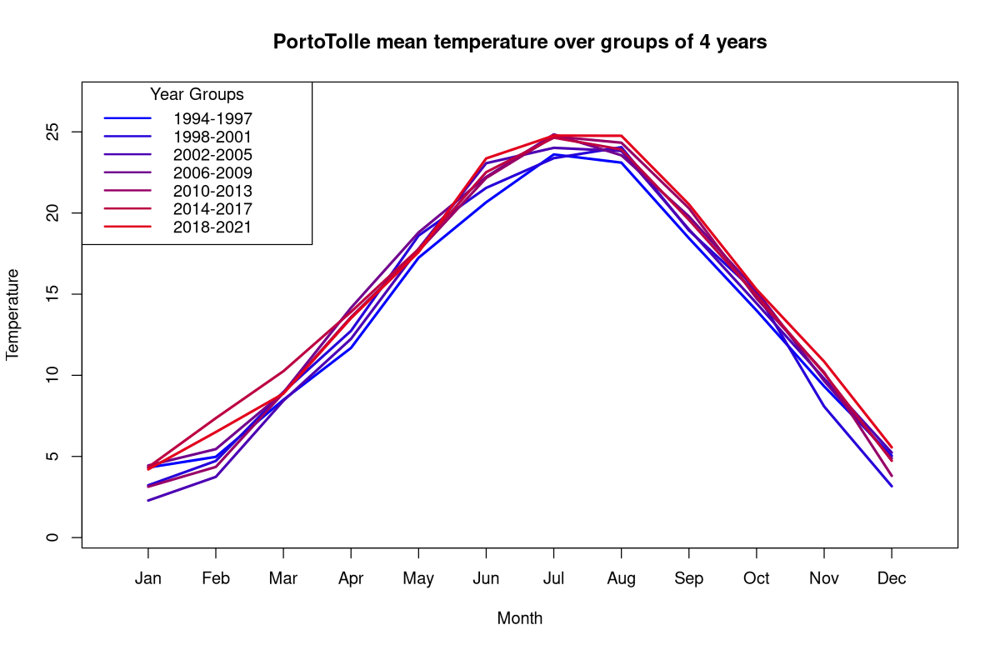

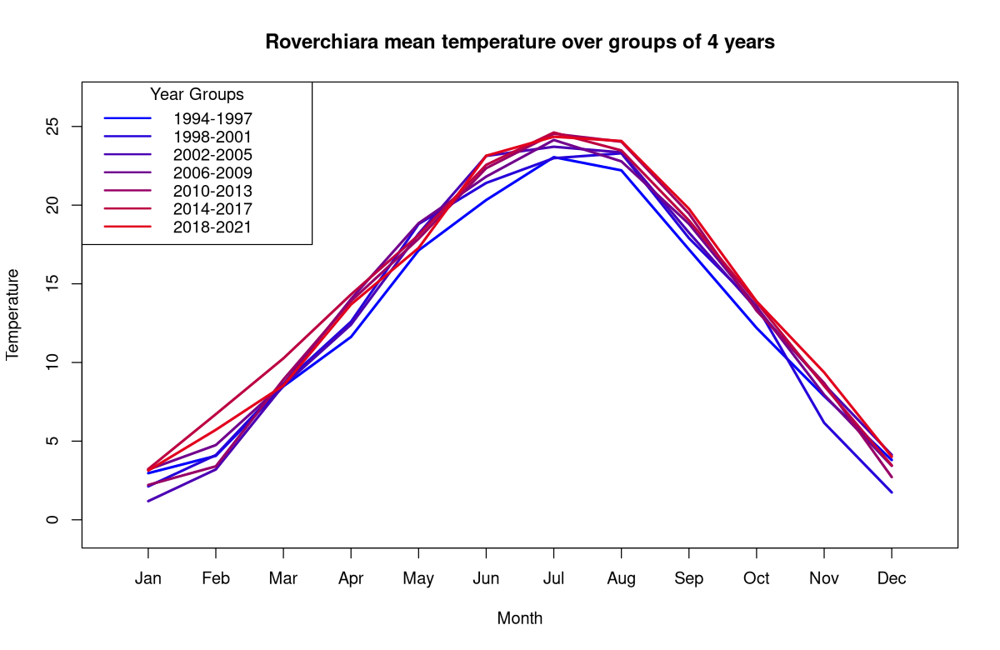

In [55]:
# we want only mean temperature
tipo <- 'mean'
group.size <- 4

# all groups and colors
n.groups <- max(years) - min(years) - group.size + 2
colors <- colorRampPalette(c("blue", "red"))(n.groups)
year.starts <- min(years):(max(years) - group.size + 1)

plot.groups.idx <- seq(1, length(year.starts), by = group.size)
legend.labels <- paste(year.starts[plot.groups.idx], year.starts[plot.groups.idx] + group.size - 1, sep = "-")
legend.colors <- colors[plot.groups.idx]

# color index
for(paese in paesi){
    # retrieve the data
    data <- df_anni[df_anni$paese == paese & df_anni$tipo == tipo,]
    max.y <- max(data[, 4:(ncol(data) - 2)])
    min.y <- min(data[, 4:(ncol(data) - 2)])

    # size of plot
    options(repr.plot.width = 10, repr.plot.height = 6.5)
    
    plot(numeric(0), numeric(0), xlim = c(0.5, 12.5), ylim = c(min.y,max.y),
         xlab = "Month", ylab = "Temperature",
         main = paste(paese, tipo, "temperature over groups of 4 years"),
         xaxt = "n",
         fig.dim = c(20,12))
    
    axis(1, at = 1:12, labels = month.abb)  # month labels

    for (i in plot.groups.idx) {
            year <- year.starts[i]
            group.years <- year:(year + group.size - 1)
            sel.data <- data[data$Anno %in% group.years, ]
            monthly.T <- sel.data[, 4:(ncol(sel.data) - 2)]
            averaged <- colMeans(monthly.T, na.rm = TRUE)
        
            lines(1:length(averaged), averaged, col = colors[i], lwd = 2.5)
           
    }
    
    legend("topleft", inset = c(0, 0),
           legend = legend.labels,
           col = legend.colors, lty = 1, lwd = 2,
           title = "Year Groups", cex = 1)
   
}


In [56]:
yrs <- min(years):(min(years)+group.size-1)
df_anni[df_anni$Anno %in% yrs,]

paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,std
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.2624613,-6.00714286,-0.716129,0.500000,5.619355,7.420000,10.383677,10.285742,8.206667,1.622581,0.4133333,-4.9096774,2.212995,1.766283
Auronzo,1994,mean,-2.3099194,-1.55483214,5.529810,5.949313,11.881345,14.831637,17.546126,17.493897,13.138443,6.734687,3.9545600,-1.7690194,7.618837,2.112294
Auronzo,1994,max,3.4565032,5.12857143,14.270968,12.413333,18.435484,22.573333,26.446681,26.264629,19.890000,13.819355,9.7900000,3.4709677,14.663319,2.382074
Auronzo,1995,min,-10.0258065,-4.21428571,-4.019355,0.580000,4.790323,7.640000,11.261290,9.070968,5.366667,1.887097,-3.0666667,-5.7000000,1.130853,1.915043
Auronzo,1995,mean,-5.1951710,-0.08460000,1.274635,6.929273,10.950977,13.236110,18.249226,14.994971,10.571880,8.024474,1.4511200,-2.3409355,6.505163,2.141889
Auronzo,1995,max,1.6870968,6.34642857,8.209677,14.466667,17.970968,19.806667,26.658065,22.548387,17.496667,17.416129,7.3066667,1.6193548,13.461064,2.376033
Auronzo,1996,min,-4.5354839,-8.63409310,-5.087097,1.280000,5.619355,7.940000,9.167742,9.561290,3.630000,2.522581,-0.7866667,-5.3645161,1.276093,1.788257
Auronzo,1996,mean,-1.7846194,-3.19952759,1.093639,7.184380,11.696577,15.799793,16.121574,14.958161,9.736357,6.873152,2.3576733,-2.5282323,6.525744,2.094892
Auronzo,1996,max,2.5677419,4.76878276,8.600000,14.223333,18.429032,23.826667,23.422581,22.554839,17.260000,12.774194,6.9233333,1.9451613,13.107972,2.337526


# 3) Future temperatures prediction with ARIMA algorithm

The *ARIMA model (AutoRegressive Integrated Moving Average)* is a statistical technique for time series analysis and forecasting, implemented in R through the *forecast* package.

- **AR (AutoRegressive):** the autoregressive component, which represents the dependence of the current value from the past values of the series;
- **I (Integrated):** the differenciation of the data to make the series stationary, so free from trends or seasonality;
- **MA (Moving Average):** the moving average component, which represents the dependence between the current value and past errors.

The ARMA model (combination of the AR and MA components) can be used only on stationary series. When the series shows a trend over time as in our case, where a linear growth is assumed, it is necessary to difference the series (I) to eliminate these instabilities and achieve stationarity. The resulting model is an ARIMA(p, d, q), where **p** indicates the number of autoregressive terms (how many past values are used to predict the current value), **d** represents how many times the data must be differenced to make the series stationary and **q** defines how many past errors are used to calculate the current value.

In our study, we used a model with maximum values of p = 15, d = 2, and q = 2.

When the series exhibits a seasonal component, as happens with monthly averages for each year, it is possible to use the version that takes into accounts seasonal effects (*SARIMA*).

In [ ]:
#install.packages("forecast")
library(forecast)

`summarise()` has grouped output by 'paese', 'year'. You can override using the `.groups` argument.



 Fitting models using approximations to speed things up...

 ARIMA(2,0,2)(1,1,1)[12] with drift         : 1275.267
 ARIMA(0,0,0)(0,1,0)[12] with drift         : 1481.8
 ARIMA(1,0,0)(1,1,0)[12] with drift         : 1349.285
 ARIMA(0,0,1)(0,1,1)[12] with drift         : 1288.335
 ARIMA(0,0,0)(0,1,0)[12]                    : 1479.934
 ARIMA(2,0,2)(0,1,1)[12] with drift         : 1273.555
 ARIMA(2,0,2)(0,1,0)[12] with drift         : 1448.185
 ARIMA(2,0,2)(0,1,2)[12] with drift         : 1275.645
 ARIMA(2,0,2)(1,1,0)[12] with drift         : 1352.515
 ARIMA(2,0,2)(1,1,2)[12] with drift         : Inf
 ARIMA(1,0,2)(0,1,1)[12] with drift         : 1287.222
 ARIMA(2,0,1)(0,1,1)[12] with drift         : 1274.739
 ARIMA(3,0,2)(0,1,1)[12] with drift         : 1278.413
 ARIMA(2,0,3)(0,1,1)[12] with drift         : 1275.471
 ARIMA(1,0,1)(0,1,1)[12] with drift         : 1285.724
 ARIMA(1,0,3)(0,1,1)[12] with drift         : 1275.978
 ARIMA(3,0,1)(0,1,1)[12] with drift         : 1276.578
 ARIMA(3,0,

Series: ts_monthly 
ARIMA(3,0,3)(1,1,0)[12] with drift 

Coefficients:
          ar1     ar2      ar3     ma1     ma2     ma3     sar1   drift
      -0.5119  0.1418  -0.0749  0.7846  0.0696  0.2065  -0.5152  0.0045
s.e.   0.6793  0.3559   0.3381  0.6740  0.5146  0.2733   0.0460  0.0066

sigma^2 = 2.522:  log likelihood = -675.55
AIC=1369.09   AICc=1369.61   BIC=1404.07

Training set error measures:
                      ME     RMSE      MAE       MPE     MAPE      MASE
Training set -0.01055858 1.544798 1.213534 -2.458286 29.00977 0.7855055
                     ACF1
Training set -0.001061785

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


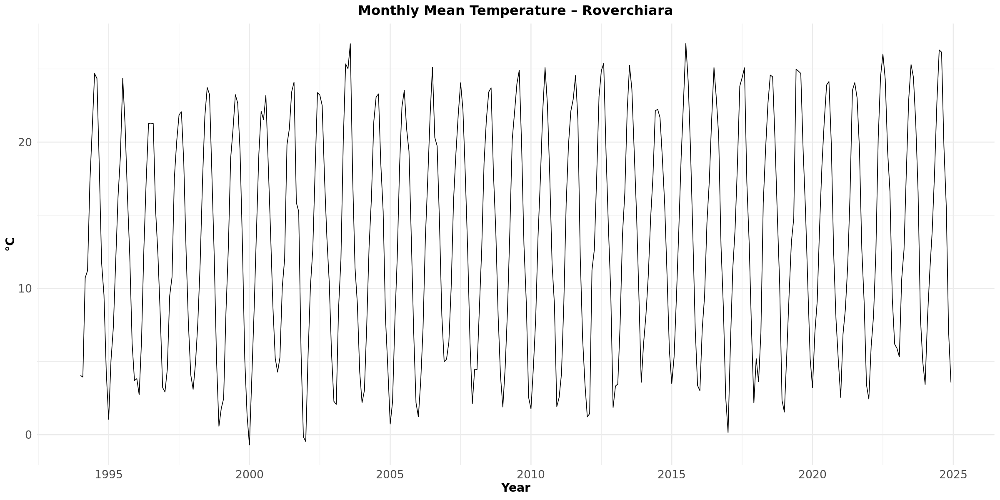

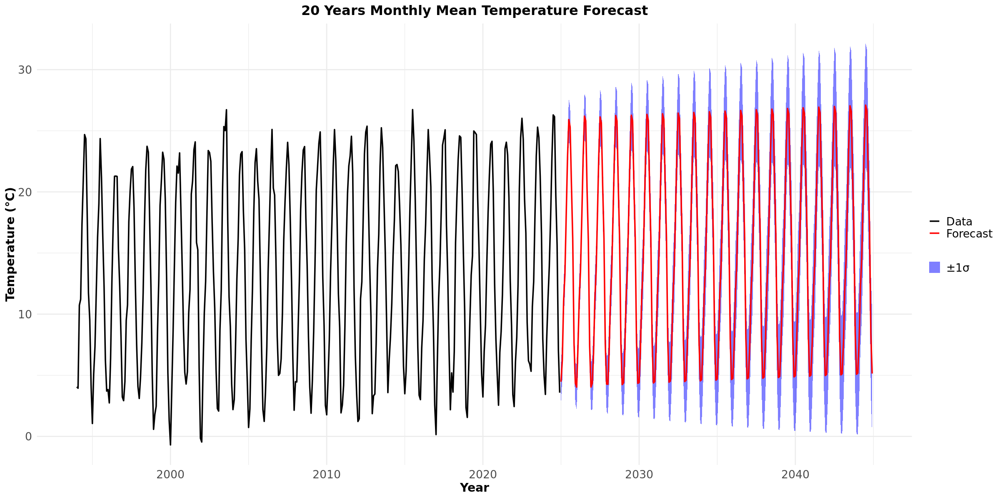

In [183]:
# monthly predictions 

df_monthly <- df_94 |>
  mutate(year  = year(date),month = month(date)) |>
  group_by(paese, year, month) |> summarise(Tmean = mean(TMED, na.rm = TRUE),groups = "drop")


df_m <- df_monthly |> filter(paese == "Roverchiara") |> arrange(year, month) # cosnider Roverchiara as example

# build a monthly timeseries 
start_year  <- df_m$year[1]
start_month <- df_m$month[1]
ts_monthly <- ts(df_m$Tmean,
                 start     = c(start_year, start_month),
                 frequency = 12)

autoplot(ts_monthly) +
  ggtitle("Monthly Mean Temperature – Roverchiara") +
  xlab("Year") + ylab("°C")+theme_custom

# SARIMA fit (ARIMA with seasonality)
fit_monthly <- auto.arima(ts_monthly, seasonal = TRUE,allowdrift = TRUE,trace = TRUE) # looks for the best combination of SARIMA model 
# fit_monthly <- Arima(ts_monthly,order=c(12,1,1),seasonal=c(0,1,1),include.mean = TRUE, include.drift=TRUE)
summary(fit_monthly)

# forecast next 20 years
fcast <- forecast(fit_monthly, h = 12*20,level = 68.27) # forecasts with +- 1sigma shaded region

df_fc <- data.frame(
  time = time(fcast$mean),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1] - fcast$lower[,1]) / 2)

ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(
      x  = time,
      ymin = mean - 1*se,
      ymax = mean + 1*se,
      fill = "±1σ" ),
    alpha = 0.5) +
  geom_line(
    data = df_fc,
    aes(x = time, y = mean, colour = "Forecast"),
    size = 1) +
  geom_line(
    aes(x = time(ts_monthly), y = as.numeric(ts_monthly), colour = "Data"),
    size = 1) +
  scale_colour_manual(
    name   = NULL,
    values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(
    name   = NULL,
    values = c("±1σ" = "blue")) +
  labs(
    title = "20 Years Monthly Mean Temperature Forecast",
    x = "Year",
    y = "Temperature (°C)") +
  theme_custom



We observe a clear upward trend in the predictions, however big error bars are present. The model appears quite simple: it replicates the sinusoidal component of the data and adds a linear trend. \
We now attempt to infere annual average temperatures to see if more precise predictions can be obtained (we use standard ARIMA here, without including the possibility of seasonality).  

`summarise()` has grouped output by 'paese'. You can override using the `.groups` argument.



 ARIMA(0,1,0)                    : 52.11339
 ARIMA(0,1,0) with drift         : 54.26814
 ARIMA(0,1,1)                    : 49.50498
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 50.71754
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 52.72925
 ARIMA(1,1,0) with drift         : 54.8
 ARIMA(1,1,1)                    : 51.25251
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : 53.20377
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 51.6527
 ARIMA(2,1,0) with drift         : 52.97821
 ARIMA(2,1,1)                    : 52.87032
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : 53.48744
 ARIMA(3,1,0) with drift         : 54.34955
 ARIMA(3,1,1)                    : 55.751
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf


Series: ts_yearly 
ARIMA(0,1,1) 

Coefficients:
          ma1
      -0.5949
s.e.   0.1661

sigma^2 = 0.2681:  log likelihood = -22.53
AIC=49.06   AICc=49.5   BIC=51.86

Training set error measures:
                   ME     RMSE       MAE       MPE     MAPE      MASE      ACF1
Training set 0.106749 0.500778 0.4086654 0.6645434 3.034919 0.9302245 0.1407182

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


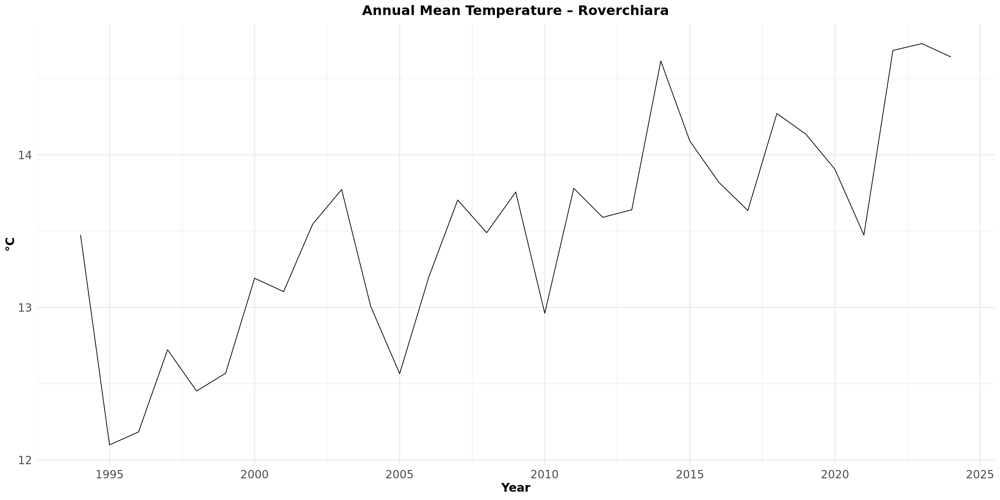

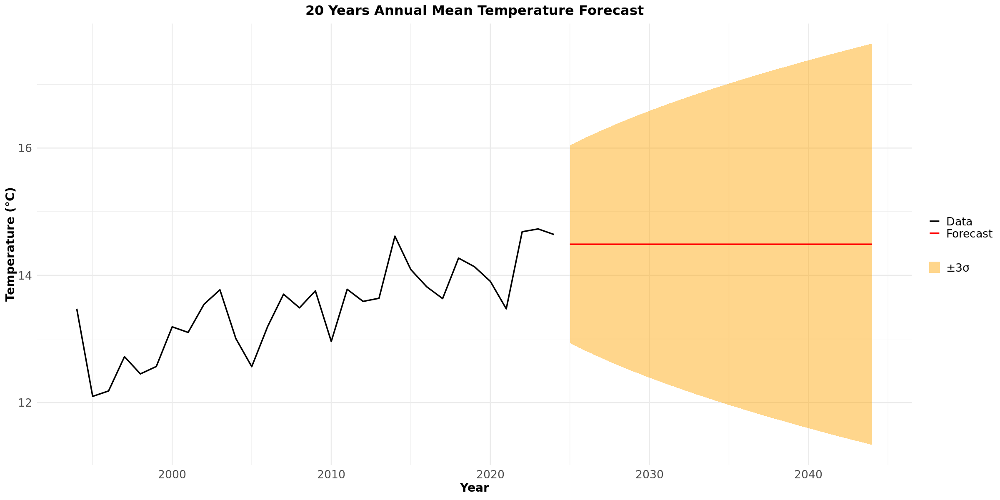

In [257]:
# annual predictions

df_yearly <- df_94 |>
  mutate(year  = year(date),month = month(date)) |>
  group_by(paese, year) |> summarise(Tmean = mean(TMED, na.rm = TRUE),groups = "drop")


df_y <- df_yearly |> filter(paese == "Roverchiara") |> arrange(year) # cosnider Roverchiara as example

# build yearly timeseries 
start_year  <- df_m$year[1]
ts_yearly <- ts(df_y$Tmean,
                 start = c(start_year),
                 frequency = 1)

autoplot(ts_yearly) +
  ggtitle("Annual Mean Temperature – Roverchiara") +
  xlab("Year") + ylab("°C")+theme_custom

# ARIMA fit 
fit_yearly <- auto.arima(ts_yearly,max.p=15,max.d=2,max.q=2,allowdrift = TRUE,trace = TRUE,stepwise = FALSE) # looks for the best combination of SARIMA model 
#fit_yearly <-  Arima(ts_yearly,order=c(10,1,1),seasonal = TRUE,include.mean = TRUE, include.drift=TRUE)
summary(fit_yearly)

# forecast next 20 years
fcast <- forecast(fit_yearly, h = 20,level = 68.27) # forecasts with +- 1sigma errors

df_fc <- data.frame(
  time = time(fcast$mean),
  mean = as.numeric(fcast$mean),
  se  = (fcast$upper[,1] - fcast$lower[,1]) / 2)

ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(
      x  = time,
      ymin = mean - 3*se,
      ymax = mean + 3*se,
      fill = "±3σ" ),
    alpha = 0.45) +
  geom_line(
    data = df_fc,
    aes(x = time, y = mean, colour = "Forecast"),
    size = 1 ) +
  geom_line(
    aes(x = time(ts_yearly), y = as.numeric(ts_yearly), colour = "Data"),
    size = 1) +
  scale_colour_manual(
    name   = NULL,
    values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(
    name   = NULL,
    values = c("±3σ" = "orange") ) +
  labs(
    title  = "20 Years Annual Mean Temperature Forecast",
    x  = "Year",
    y  = "Temperature (°C)") +
  theme_custom

The algorithm identifies a constant model as the best fit ($p=0$, indicating that past observations are not utilized for forecasting). This suggests that the annual average temperature data may be too noisy for reliable prediction. To address this, we now try to average the data over multiple years in order to reduce volatility and improve forecast accuracy.


 ARIMA(0,1,0)                    : 8.544315
 ARIMA(0,1,0) with drift         : 6.739831
 ARIMA(0,1,1)                    : 11.71448
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 13.61464
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 11.66686
 ARIMA(1,1,0) with drift         : 1.556338
 ARIMA(1,1,1)                    : Inf
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : Inf
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 8.7892
 ARIMA(2,1,0) with drift         : 7.482644
 ARIMA(2,1,1)                    : Inf
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : 14.71627
 ARIMA(3,1,0) with drift         : 10.08713
 ARIMA(3,1,1)                    : Inf
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf



 Best model:

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


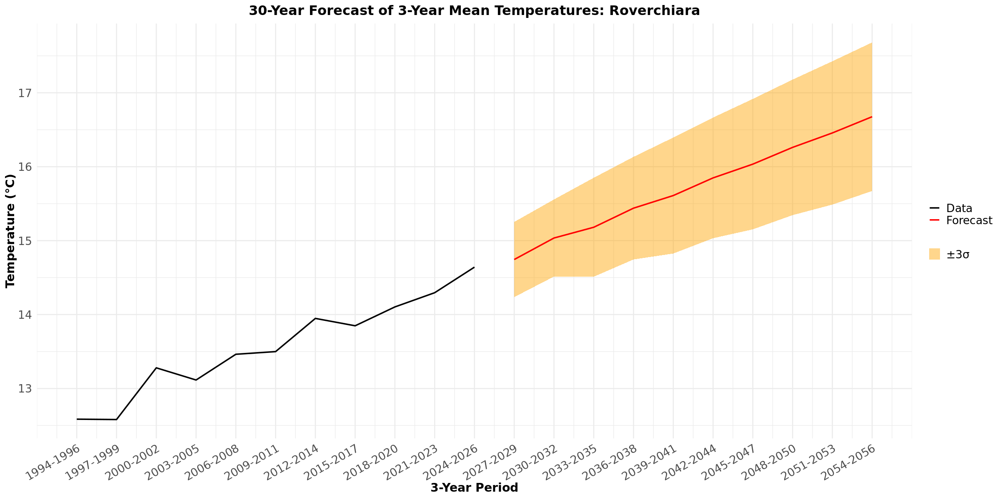

In [251]:
# 3 year-average predictions

min_year <- min(year(df_94$date), na.rm = TRUE)

df_3yr <- df_94 |> mutate(
    year = year(date),
    year_group = floor((year-min_year)/3)) |>
    group_by(paese, year_group) |>
    summarise(
    Tmean   = mean(TMED, na.rm = TRUE),
    .groups = "drop") |>
    mutate(
    start_year = min_year+ 3*year_group,
    end_year = start_year+2,
    period   = paste0(start_year, "-", end_year))

df_3yr <- df_3yr |>
  filter(paese == "Roverchiara") |>
  arrange(start_year)

# define timeseries of temperatures
ts_3yr <- ts(df_3yr$Tmean, start = 1, frequency = 1)


fit_3yr <- auto.arima(ts_3yr, max.p = 15, max.d = 2, max.q = 2,
                      allowdrift = TRUE, trace = TRUE, stepwise = FALSE) # find best model

# forecast next 10 groups (30 years)
fcast <- forecast(fit_3yr, h=10, level= 68.27)

df_fc <- data.frame(
  time = as.numeric(time(fcast$mean)),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1]-fcast$lower[,1])/2)

df_fc$period <- paste0(
df_3yr$end_year[nrow(df_3yr)] + 1+3*(0:9), "-",
df_3yr$end_year[nrow(df_3yr)] + 3*(1:10))

df_3yr$time <- 1:nrow(df_3yr)

# period labels
x_ticks <- c(df_3yr$time, df_fc$time)
x_labels <- c(df_3yr$period, df_fc$period)

options(repr.plot.width = 20, repr.plot.height=10)
ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(x = time, ymin = mean -3*se, ymax = mean +3*se, fill = "±3σ"),
    alpha = 0.45) +
  geom_line(data = df_fc, aes(x = time, y = mean, colour = "Forecast"), size = 1) +
  geom_line(data = df_3yr, aes(x = time, y = Tmean, colour = "Data"), size = 1) +
  scale_x_continuous(
    breaks = x_ticks,
    labels = x_labels) +
  scale_colour_manual(name = NULL, values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(name = NULL, values = c("±3σ" = "orange")) +
  labs(
    title = "30-Year Forecast of 3-Year Mean Temperatures: Roverchiara",
    x = "3-Year Period",
    y = "Temperature (°C)") +
  theme_custom +
  theme(axis.text.x = element_text(angle=30, hjust = 1))

In [253]:
lm_fcast <- lm(mean ~ time, data = df_fc)
slope <- coef(lm_fcast)[["time"]]/3
model_summary <- summary(lm_fcast)
slope_se  <- model_summary$coefficients["time", "Std. Error"]/3
print(paste("Slope of forecast in Roverchiara: +", round(slope*10,2),"+-",round(slope_se*10,2), "°C/10-year"))

[1] "Slope of forecast in Roverchiara: + 0.7 +- 0.01 °C/10-year"


The algorithm is forecasting a higher increase in mean temperatures in Roverchiara compared to what we found with a Bayesian linear model analysis ($0.40\pm0.12 °C/10$ $year$). \
We repeat the same analysis for Porto Tolle and Auronzo di Cadore.


 ARIMA(0,1,0)                    : 9.868828
 ARIMA(0,1,0) with drift         : 9.433083
 ARIMA(0,1,1)                    : 12.6656
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 12.49312
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 12.12255
 ARIMA(1,1,0) with drift         : 3.242329
 ARIMA(1,1,1)                    : Inf
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : 18.43397
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 11.55532
 ARIMA(2,1,0) with drift         : 8.878256
 ARIMA(2,1,1)                    : Inf
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : Inf
 ARIMA(3,1,0) with drift         : 15.74693
 ARIMA(3,1,1)                    : Inf
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf



 Best model

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


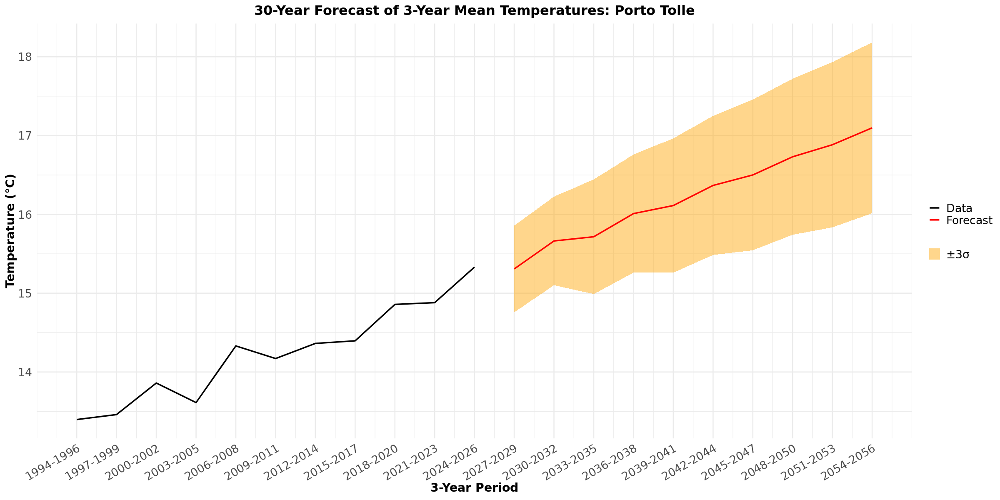

In [246]:
# 3 year-average predictions PortoTolle

min_year <- min(year(df_94$date), na.rm = TRUE)

df_3yr <- df_94 |> mutate(
    year = year(date),
    year_group = floor((year-min_year)/3)) |>
    group_by(paese, year_group) |>
    summarise(
    Tmean   = mean(TMED, na.rm = TRUE),
    .groups = "drop") |>
    mutate(
    start_year = min_year+ 3*year_group,
    end_year = start_year+2,
    period   = paste0(start_year, "-", end_year))

df_3yr <- df_3yr |>
  filter(paese == "PortoTolle") |>
  arrange(start_year)

# define timeseries of temperatures
ts_3yr <- ts(df_3yr$Tmean, start = 1, frequency = 1)


fit_3yr <- auto.arima(ts_3yr, max.p = 15, max.d = 2, max.q = 2,
                      allowdrift = TRUE, trace = TRUE, stepwise = FALSE) # find best model

# forecast next 10 groups (30 years)
fcast <- forecast(fit_3yr, h=10, level= 68.27)

df_fc <- data.frame(
  time = as.numeric(time(fcast$mean)),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1]-fcast$lower[,1])/2)

df_fc$period <- paste0(
df_3yr$end_year[nrow(df_3yr)] + 1+3*(0:9), "-",
df_3yr$end_year[nrow(df_3yr)] + 3*(1:10))

df_3yr$time <- 1:nrow(df_3yr)

# period labels
x_ticks <- c(df_3yr$time, df_fc$time)
x_labels <- c(df_3yr$period, df_fc$period)

options(repr.plot.width = 20, repr.plot.height=10)
ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(x = time, ymin = mean -3*se, ymax = mean +3*se, fill = "±3σ"),
    alpha = 0.45) +
  geom_line(data = df_fc, aes(x = time, y = mean, colour = "Forecast"), size = 1) +
  geom_line(data = df_3yr, aes(x = time, y = Tmean, colour = "Data"), size = 1) +
  scale_x_continuous(
    breaks = x_ticks,
    labels = x_labels) +
  scale_colour_manual(name = NULL, values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(name = NULL, values = c("±3σ" = "orange")) +
  labs(
    title = "30-Year Forecast of 3-Year Mean Temperatures: Porto Tolle",
    x = "3-Year Period",
    y = "Temperature (°C)") +
  theme_custom +
  theme(axis.text.x = element_text(angle=30, hjust = 1))

In [247]:
lm_fcast <- lm(mean ~ time, data = df_fc)
slope <- coef(lm_fcast)[["time"]]/3
model_summary <- summary(lm_fcast)
slope_se  <- model_summary$coefficients["time", "Std. Error"]/3
print(paste("Slope of forecast in Porto Tolle: +", round(slope*10,2),"+-",round(slope_se*10,2), "°C/10-year"))

[1] "Slope of forecast in Porto Tolle: + 0.64 +- 0.02 °C/10-year"


Again, the algorithm forecasts a higher increase in mean temperatures compared to what was found with a Bayesian linear model ($0.37\pm0.10 °C/10$ $year$). 


 ARIMA(0,1,0)                    : 11.33851
 ARIMA(0,1,0) with drift         : 13.08785
 ARIMA(0,1,1)                    : 12.8136
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 14.93089
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 11.02576
 ARIMA(1,1,0) with drift         : 10.25316
 ARIMA(1,1,1)                    : Inf
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : Inf
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 13.9349
 ARIMA(2,1,0) with drift         : 16.21138
 ARIMA(2,1,1)                    : Inf
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : 19.86233
 ARIMA(3,1,0) with drift         : 20.72626
 ARIMA(3,1,1)                    : Inf
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf



 Best model:

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


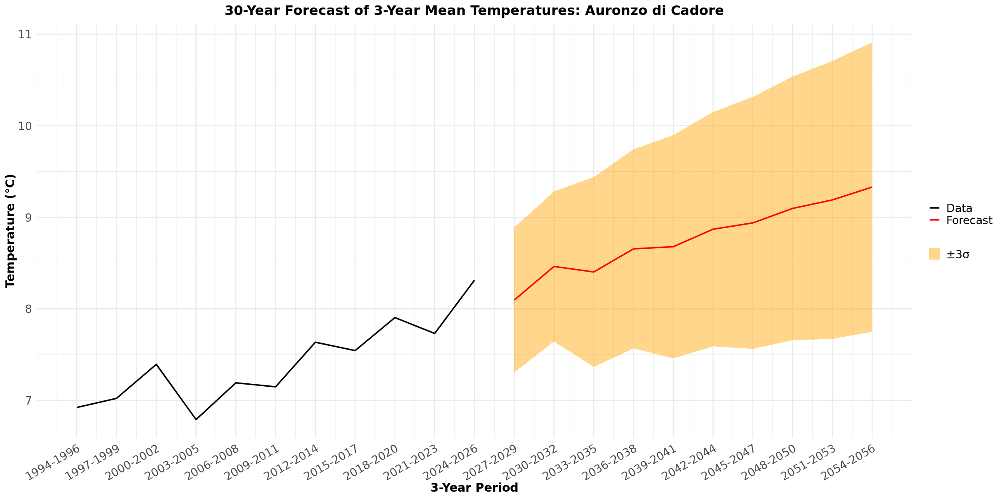

In [233]:
# 3 year-average predictions Auronzo di Cadore

min_year <- min(year(df_94$date), na.rm = TRUE)

df_3yr <- df_94 |> mutate(
    year = year(date),
    year_group = floor((year-min_year)/3)) |>
    group_by(paese, year_group) |>
    summarise(
    Tmean   = mean(TMED, na.rm = TRUE),
    .groups = "drop") |>
    mutate(
    start_year = min_year+ 3*year_group,
    end_year = start_year+2,
    period   = paste0(start_year, "-", end_year))

df_3yr <- df_3yr |>
  filter(paese == "Auronzo") |>
  arrange(start_year)

# define timeseries of temperatures
ts_3yr <- ts(df_3yr$Tmean, start = 1, frequency = 1)


fit_3yr <- auto.arima(ts_3yr, max.p = 15, max.d = 2, max.q = 2,
                      allowdrift = TRUE, trace = TRUE, stepwise = FALSE) # find best model

# forecast next 10 groups (30 years)
fcast <- forecast(fit_3yr, h=10, level= 68.27)

df_fc <- data.frame(
  time = as.numeric(time(fcast$mean)),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1]-fcast$lower[,1])/2)

df_fc$period <- paste0(
df_3yr$end_year[nrow(df_3yr)] + 1+3*(0:9), "-",
df_3yr$end_year[nrow(df_3yr)] + 3*(1:10))

df_3yr$time <- 1:nrow(df_3yr)

# period labels
x_ticks <- c(df_3yr$time, df_fc$time)
x_labels <- c(df_3yr$period, df_fc$period)

options(repr.plot.width = 20, repr.plot.height=10)
ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(x = time, ymin = mean -3*se, ymax = mean +3*se, fill = "±3σ"),
    alpha = 0.45) +
  geom_line(data = df_fc, aes(x = time, y = mean, colour = "Forecast"), size = 1) +
  geom_line(data = df_3yr, aes(x = time, y = Tmean, colour = "Data"), size = 1) +
  scale_x_continuous(
    breaks = x_ticks,
    labels = x_labels) +
  scale_colour_manual(name = NULL, values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(name = NULL, values = c("±3σ" = "orange")) +
  labs(
    title = "30-Year Forecast of 3-Year Mean Temperatures: Auronzo di Cadore",
    x = "3-Year Period",
    y = "Temperature (°C)") +
  theme_custom +
  theme(axis.text.x = element_text(angle=30, hjust = 1))

In [238]:
lm_fcast <- lm(mean ~ time, data = df_fc)
slope <- coef(lm_fcast)[["time"]]/3
model_summary <- summary(lm_fcast)
slope_se  <- model_summary$coefficients["time", "Std. Error"]/3
print(paste("Slope of forecast in Auronzo: +", round(slope*10,2),"+-",round(slope_se*10,2), "°C/10-year"))


[1] "Slope of forecast in Auronzo: + 0.42 +- 0.03 °C/10-year"


Fianlly, also in Auronzo di Cadore ARIMA forecasts a higher increase in mean temperatures compared to a Bayesian linear model ($0.22\pm0.08 °C/10$ $year$). 

We can compare these results with the study available in the 2021 SNPA Annual report (https://www.snpambiente.it/wp-content/uploads/2021/06/Rapporto-SNPA-21_2021.pdf), which provides a forecast for the mean temperatures in Italy under two different socio-economic and emission scenarios:
- RCP4.5 model considers a scenario with a decrease in greenhouse emissions starting from 2040, and predicts an average increase in mean temperatures of $0.2 °C/ 10$ $year$ over the century. 
- RCP8.5 model instead considers a scenario with a continous increase in greenhouse emissions during the century, without significant mitigation, and thus predicts an average increase in mean temperatures of $0.4 °C/ 10$ $year$ over the century.
  
  
The predictions from the ARIMA algorithm, limited to data from only 3 cities in a specific Italian region, are more consistent with the most pessimistic scenario. 

In [271]:
library(IRdisplay)
display_html('<div style="text-align: center;"><img src="SNPA_predictions.png" width="700"/></div>')